/home/ubuntu/anaconda3/envs/tensorflow8/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


1.8.0
[[22. 28.]
 [49. 64.]]


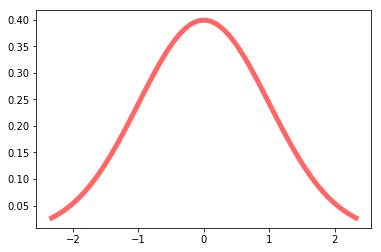

In [1]:
# set up anaconda environment (YMMV)
# conda create -n tensorflow python=3.6 anaconda
# conda activate tensorflow
# conda update --all
# conda install scipy pandas scikit-learn cython matplotlib plotly nose statsmodels ipykernel
# conda install -c  'conda-forge' xgboost catboost lightgbm
# pip install --ignore-installed --upgrade tensorflow_gpu-1.8.0-cp36-cp36m-linux_x86_64.whl
# conda update --all
# sudo /home/ubuntu/anaconda3/envs/tensorflow5/bin/python -m ipykernel install --name tensorflow
# sudo reboot

import time
from itertools import product
import random
random.seed(1744)

import numpy as np
#np.random.seed(1744)
from scipy.stats import norm, truncnorm
import pandas as pd
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.utils.testing import all_estimators

import statsmodels.discrete.discrete_model

# popular gradient boost algorithms
# XGBoost https://xgboost.readthedocs.io/en/latest/
import xgboost 
# Yandex CatBoost https://catboost.yandex/
import catboost 
# Microsoft LightGbm https://lightgbm.readthedocs.io/en/latest/
import lightgbm as lgb 

import tensorflow as tf
#tf.set_random_seed(1744)
print(tf.__version__)
# confirm GPU is in use
with tf.device('/gpu:0'):
    a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')
    b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')
    c = tf.matmul(a, b)

sess = tf.Session()
print (sess.run(c))

from tensorflow.python import keras
from tensorflow.python.keras.layers import Input, Dense, Activation
from tensorflow.python.keras.models import Model
from tensorflow.python.keras import backend as K
K.set_session(sess)
from tensorflow.python.keras.wrappers.scikit_learn import KerasClassifier

import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots(1, 1)
x = np.linspace(norm.ppf(0.01),
                norm.ppf(0.99), 100)
ax.plot(x, norm.pdf(x),
       'r-', lw=5, alpha=0.6, label='norm pdf')

import plotly
# print (plotly.__version__) # requires version >= 1.9.0
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.figure_factory as ff

init_notebook_mode(connected=True)

In [2]:
npoints = 2000
distspec0 = [25, 25, 50]
distspec1 = [80,80,20]

def gen_data(distspec0, distspec1, npoints):
    # create 100x100 grid
    # distro centered at 25,25, with normal distribution sd 50, truncate at 0 and 100
    locx, locy, my_std = distspec0
    # define clip a,b in terms of locx, my_std
    clipmin, clipmax=0,100
    a, b = (clipmin - locx) / my_std, (clipmax - locx) / my_std
    var1_x = truncnorm.rvs(a,b, loc=locx, scale=my_std, size=npoints)
    a, b = (clipmin - locy) / my_std, (clipmax - locy) / my_std
    var1_y = truncnorm.rvs(a,b, loc=locy, scale=my_std, size=npoints)
    class1 = np.array([var1_x,var1_y, [0]*npoints]).T
    print(class1.shape)

    # 2nd distro centered at 80, 80, sd 20, to create a nonlinear decision boundary
    locx, locy, my_std = distspec1
    a, b = (clipmin - locx) / my_std, (clipmax - locx) / my_std
    var2_x = truncnorm.rvs(a,b, loc=locx, scale=my_std, size=npoints)
    a, b = (clipmin - locx) / my_std, (clipmax - locx) / my_std
    var2_y = truncnorm.rvs(a,b, loc=locx, scale=my_std, size=npoints)
    class2 = np.array([var2_x,var2_y, [1]*npoints]).T
    print(class2.shape)

    # combine 2 distros for some kurtosis
    #tmp1_x = truncnorm.rvs(-3,1, loc=75, scale=25, size=npoints//2 )
    #tmp1_y = truncnorm.rvs(-3,1, loc=75, scale=25, size=npoints//2)
    #tmp2_x = truncnorm.rvs(-4,1, loc=80, scale=20, size=npoints//2 )
    #tmp2_y = truncnorm.rvs(-4,1, loc=80, scale=20, size=npoints//2)
    #var2_x = np.vstack([tmp1_x, tmp2_x]).T
    #var2_y = np.vstack([tmp1_y, tmp2_y]).T
    #class2 = np.vstack([var2_x,var2_y])
    #print(class2.shape)
    #class2 = np.hstack([class2, np.array([1]*npoints).reshape(npoints,1)])
    #print(class2.shape)
    
    data = np.vstack([class1, class2])
    print(data.shape)
    return data, class1, class2

data, class1, class2 = gen_data(distspec0, distspec1, npoints)
cvdata, class1_cv, class2_cv = gen_data(distspec0, distspec1, npoints)
testdata, class1_test, class2_test = gen_data(distspec0, distspec1, npoints)

pd.DataFrame(data, columns=['x', 'y', 'class'])

(2000, 3)
(2000, 3)
(4000, 3)
(2000, 3)
(2000, 3)
(4000, 3)
(2000, 3)
(2000, 3)
(4000, 3)


,x,y,class
0,52.918333,78.989624,0.0
1,68.315557,22.064002,0.0
2,28.001502,31.587202,0.0
3,38.610370,53.289051,0.0
4,14.982336,23.206552,0.0
5,19.355515,50.383591,0.0
6,27.062106,70.344430,0.0
7,32.458641,1.750008,0.0
8,66.819768,74.933072,0.0
9,59.252026,10.864620,0.0


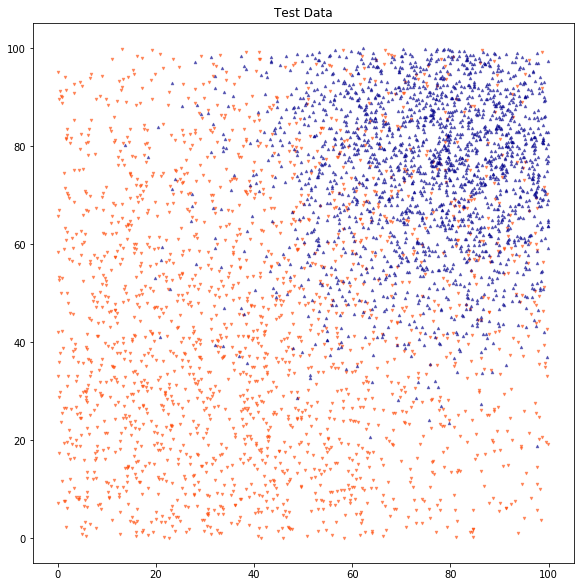

In [3]:
def class_chart(X1, X2, probas):
    
    trace1 = Scatter(
        x = X1[:,0],
        y = X1[:,1],
        mode = 'markers',
        marker = dict(
            size = 3,
            color="red"
        )
    )

    trace2 = Scatter(
        x = X2[:,0],
        y = X2[:,1],
        mode = 'markers',
        marker = dict(
            size = 3,
            color="blue"
        )
    )

    trace3 = Scatter(
        x = probas[:,0],
        y = probas[:,1],
        mode = 'markers',
        marker = dict(
            size = 6,
            opacity = 0.5*abs(probas[:,2]-0.5),
            color = probas[:,2]-0.5,
            colorscale='RdYlBu',  
            symbol = 'square'
        )
    )
    
    data = [trace1, trace2, trace3]
    layout = Layout(
        #        title = title,
        autosize=False,
        width=900,
        height=900,
    )

    fig = Figure(data=data, layout=layout)

    return iplot(fig)

# plotly may slow down the browser with this many complex charts
# also doesn't render in github because it's all JS

dpi = 96

def class_chart_matplotlib(X1, X2, probas, title="", widget=None, markersize=6, bgsize=20):
    if widget is None:
        fig, widget = plt.subplots(figsize=(931/dpi,954/dpi))
    #plt.figure(figsize=(12,12))
    widget.scatter(X1[:,0], X1[:,1], s=markersize, c='orangered', marker='v', alpha=0.5)
    widget.scatter(X2[:,0], X2[:,1], s=markersize, c='darkblue', marker='^', alpha=0.5)
    if probas is not None:
        widget.scatter(probas[:,0], probas[:,1], c=probas[:,2]-0.5, cmap="bwr", marker='s', s=bgsize, alpha=0.15)
    if title:
        widget.set_title(title)
    
    #plt.show()

class_chart_matplotlib(class1, class2, None, "Test Data")

In [4]:
X = data[:, :2]
y = data[:, 2]

X_cv = cvdata[:, :2]
y_cv = cvdata[:, 2]

X_test = testdata[:, :2]
y_test = testdata[:, 2]

# predictors generated over whole grid to shade probs
X_pred = np.array(list(product(np.linspace(0,100,101),np.linspace(0,100,101))))



In-Sample Accuracy: 0.8478
Out-Of-Sample Accuracy: 0.8515
Confusion Matrix:
[[1639  361]
 [ 233 1767]]
(True negative 1639 True positive 1767 False positive 233 False negative 361)


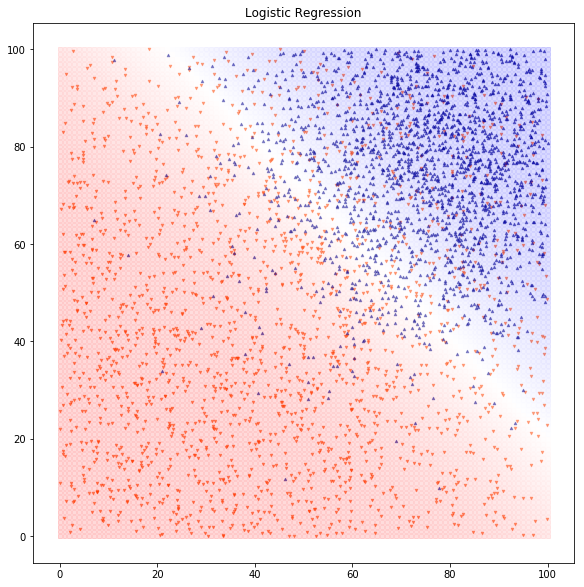

In [5]:
est = LogisticRegression()
est.fit(X, y)
y_pred = est.predict(X)

print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
y_test_pred = est.predict(X_test)
print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
print("Confusion Matrix:")
conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
print (conf_mat)
print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

z = est.predict_proba(X_pred)
Z = np.hstack([X_pred, z])
class_chart_matplotlib(class1_test, class2_test, Z, "Logistic Regression", bgsize=15)    

0.05865848308726673 0.057440855784514334 -7.064090601636692


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning:

invalid value encountered in less



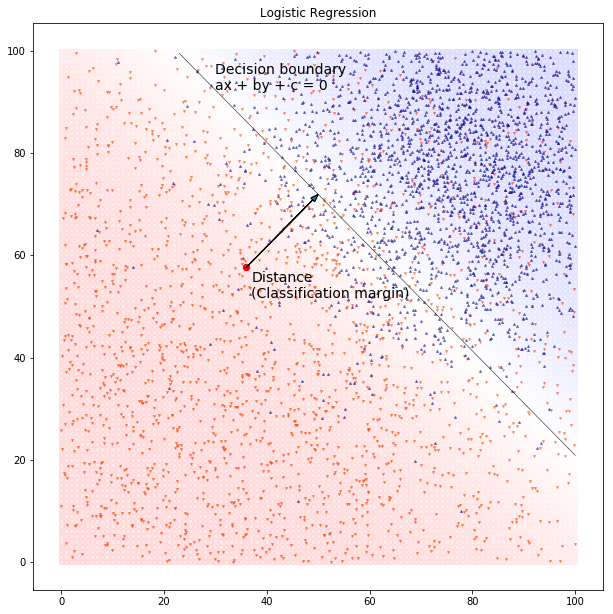

In [6]:
a, b = (est.coef_[0,0], est.coef_[0,1])
c = est.intercept_[0]
print(a,b,c)
my_x = np.linspace(0,100,101)
my_y = (-c - a * my_x)/b
my_y[my_y > 100.5] = np.nan
my_y[my_y < 0.5] = np.nan

dpi = 96
fig, widget = plt.subplots(figsize=(981/dpi,1001/dpi))
widget.scatter(class1_test[:,0], class1_test[:,1], s=4, c='orangered', marker='v', alpha=0.5)
widget.scatter(class2_test[:,0], class2_test[:,1], s=4, c='darkblue', marker='^', alpha=0.5)
widget.scatter(Z[:,0], Z[:,1], c=Z[:,2]-0.5, cmap="bwr", marker='s', s=17, alpha=0.1)
widget.plot(my_x, my_y, c='black', lw=0.5)
widget.set_title("Logistic Regression")

vec_xlength, vec_ylength = -b / np.sqrt(b**2 + a**2) *20, -a / np.sqrt(b**2 + a**2) *20
widget.arrow(my_x[50]+ vec_xlength, my_y[50] + vec_ylength, -vec_xlength, -vec_ylength, head_width=1, length_includes_head=True)
widget.scatter(x=my_x[50]+ vec_xlength, y=my_y[50]+vec_ylength, c='red', s=40, label='point')
widget.text(x=my_x[50]+ vec_xlength+1, y=my_y[50]+vec_ylength-6, s='Distance\n(Classification margin)', fontsize=14)
widget.text(x=my_x[30], y=my_y[30], s='Decision boundary\nax + by + c = 0', fontsize=14)

widget.arrow(my_x[50]+ vec_xlength, my_y[50] + vec_ylength, -vec_xlength, -vec_ylength, head_width=1, length_includes_head=True)


0.25
0.5
0.75


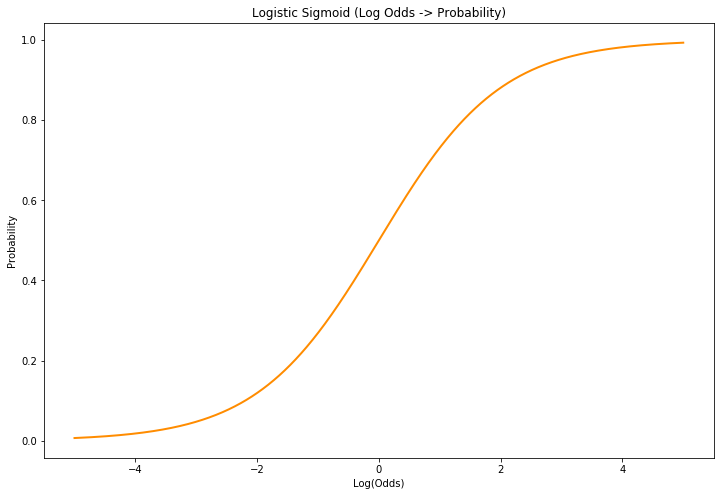

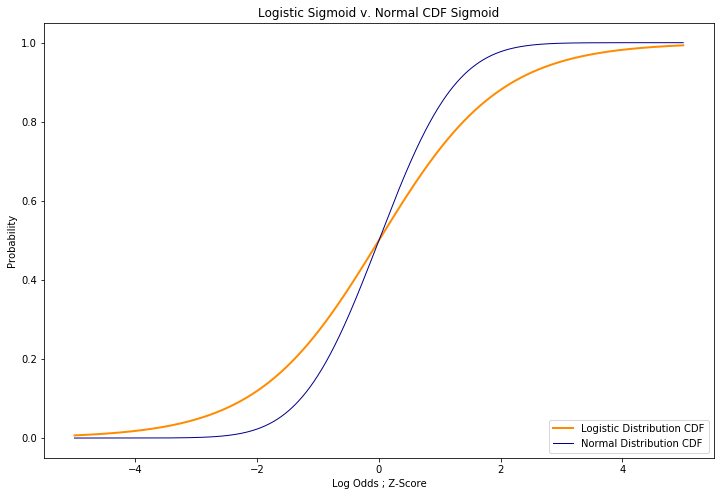

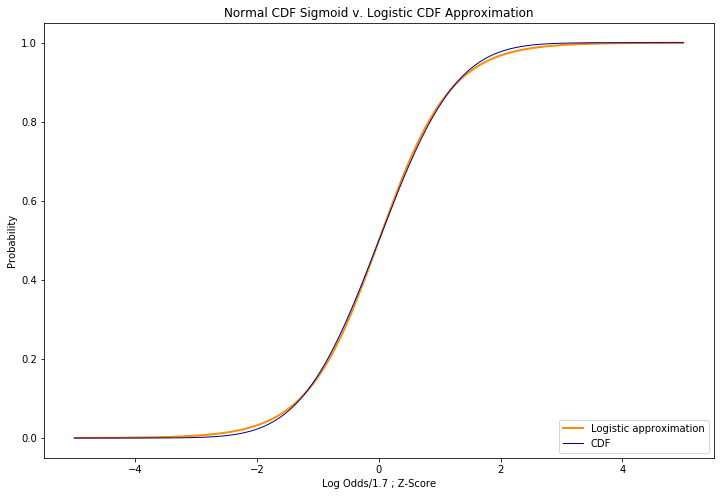

In [7]:
def logistic_sigmoid(x):
    return 1.0 / (1 + np.exp(-x))

print(logistic_sigmoid(np.log(1/3)))
print(logistic_sigmoid(0))
print(logistic_sigmoid(np.log(3)))

x_dist = np.linspace(-5, 5, 1000)
y_logistic = logistic_sigmoid(x_dist)
y_logistic_approx = logistic_sigmoid(x_dist*1.7)
y_normcdf = norm.cdf(x_dist)

plt.figure(figsize=(931/dpi,621/dpi))
plt.plot(x_dist, y_logistic, lw=2, c='darkorange', alpha=1)
plt.ylabel('Probability')
plt.xlabel('Log(Odds)')
plt.title('Logistic Sigmoid (Log Odds -> Probability)')
plt.show()

plt.figure(figsize=(931/dpi,621/dpi))
plt.plot(x_dist, y_logistic, lw=2, c='darkorange', alpha=1, label = 'Logistic Distribution CDF')
plt.plot(x_dist, y_normcdf, lw=1, c='darkblue', alpha=1, label = 'Normal Distribution CDF')
plt.legend(loc="lower right")
plt.ylabel('Probability')
plt.xlabel('Log Odds ; Z-Score')
plt.title('Logistic Sigmoid v. Normal CDF Sigmoid')
plt.show()

plt.rcParams['text.usetex'] = 'false'
plt.figure(figsize=(931/dpi,621/dpi))
plt.plot(x_dist, y_logistic_approx, lw=2, c='darkorange', alpha=1, label = 'Logistic approximation')
plt.plot(x_dist, y_normcdf, lw=1, c='darkblue', alpha=1, label = 'CDF')
plt.legend(loc="lower right")
plt.ylabel('Probability')
plt.xlabel('Log Odds/1.7 ; Z-Score')
plt.title('Normal CDF Sigmoid v. Logistic CDF Approximation')
plt.show()

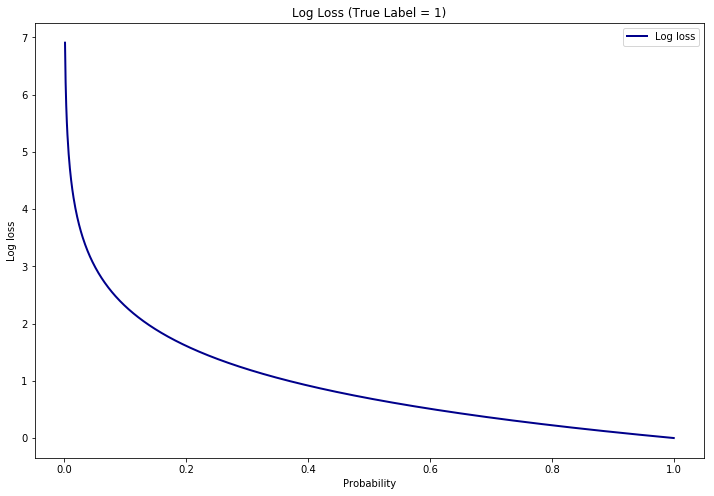

In [8]:
x_dist = np.linspace(0.001, 1, 1000)
log_loss = -np.log(x_dist)

plt.figure(figsize=(931/dpi,621/dpi))
plt.plot(x_dist, log_loss, lw=2, c='darkblue', alpha=1, label = 'Log loss')
plt.legend(loc="upper right")
plt.ylabel('Log loss')
plt.xlabel('Probability')
plt.title('Log Loss (True Label = 1)')
plt.show()

[[50 50]]
[[0.77887521 0.22112479]]
[0.]
[-1.25912366]
[0.22112479]
AUC: 0.9199


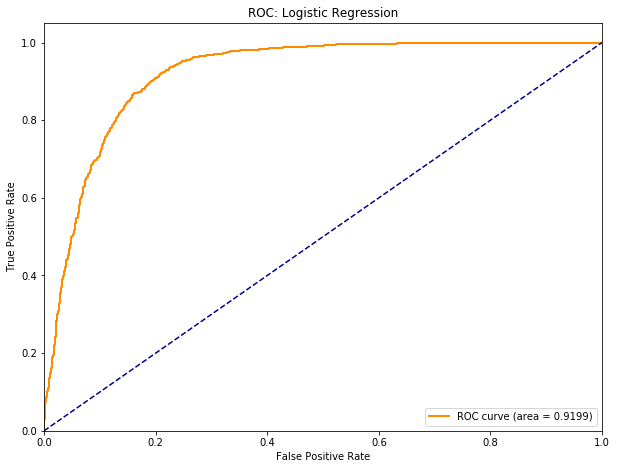

In [9]:
# ROC curve

XX = np.array([50,  50]).reshape(1,2)
print(XX)
print(est.predict_proba(XX))
print(est.predict(XX))
print(est.decision_function(XX))
print(1 / (1 + np.exp(-est.decision_function(XX))))

def roc_chart(est, X_test, y_test, title):
    y_pred_prob = est.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    auc_val = auc(fpr, tpr)
    print("AUC: %.4f" % auc_val)
    
    plt.figure(figsize=(931/dpi,621/dpi))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.4f)' % auc_val)
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    if title:
        plt.title(title)
    plt.legend(loc="lower right")
    plt.show()
    
roc_chart(est, X_test, y_test, "ROC: Logistic Regression")

In [10]:
y_pred_prob = est.predict_proba(X)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
for thresh in thresholds:
    my_y_pred = y_pred_prob > thresh
    acc = sklearn.metrics.accuracy_score(y_test, my_y_pred)
    f1_score = sklearn.metrics.f1_score(y_test, my_y_pred)
    print("Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

def select_threshold(y_test, y_pred_prob, metric_fn):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    metric_list = []
    for i, thresh in enumerate(thresholds):
        my_y_pred = y_pred_prob > thresh
        metric = metric_fn(y_test, my_y_pred)
        metric_list.append(metric)
    return thresholds[np.argmax(metric_list)]

print("")
thresh = select_threshold(y_test, y_pred_prob, sklearn.metrics.accuracy_score)
my_y_pred = y_pred_prob > thresh
acc = sklearn.metrics.accuracy_score(y_test, my_y_pred)
f1_score = sklearn.metrics.f1_score(y_test, my_y_pred)
print("Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

print("")
thresh = select_threshold(y_test, y_pred_prob, sklearn.metrics.f1_score)
my_y_pred = y_pred_prob > thresh
acc = sklearn.metrics.accuracy_score(y_test, my_y_pred)
f1_score = sklearn.metrics.f1_score(y_test, my_y_pred)
print("Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))



Threshold 1.9881 Accuracy 0.5000 F1 0.0000
Threshold 0.9881 Accuracy 0.5000 F1 0.0000
Threshold 0.9855 Accuracy 0.5005 F1 0.0030
Threshold 0.9849 Accuracy 0.5008 F1 0.0040
Threshold 0.9819 Accuracy 0.5035 F1 0.0159
Threshold 0.9819 Accuracy 0.5038 F1 0.0168
Threshold 0.9814 Accuracy 0.5045 F1 0.0208
Threshold 0.9813 Accuracy 0.5048 F1 0.0217
Threshold 0.9769 Accuracy 0.5095 F1 0.0411
Threshold 0.9768 Accuracy 0.5098 F1 0.0420
Threshold 0.9767 Accuracy 0.5100 F1 0.0439
Threshold 0.9763 Accuracy 0.5100 F1 0.0448
Threshold 0.9739 Accuracy 0.5142 F1 0.0618
Threshold 0.9739 Accuracy 0.5145 F1 0.0627
Threshold 0.9735 Accuracy 0.5148 F1 0.0646
Threshold 0.9735 Accuracy 0.5150 F1 0.0655
Threshold 0.9727 Accuracy 0.5170 F1 0.0738
Threshold 0.9726 Accuracy 0.5172 F1 0.0747
Threshold 0.9721 Accuracy 0.5185 F1 0.0802
Threshold 0.9721 Accuracy 0.5188 F1 0.0811
Threshold 0.9706 Accuracy 0.5208 F1 0.0893


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.



Threshold 0.9705 Accuracy 0.5210 F1 0.0902
Threshold 0.9651 Accuracy 0.5353 F1 0.1413
Threshold 0.9651 Accuracy 0.5355 F1 0.1422
Threshold 0.9648 Accuracy 0.5360 F1 0.1447
Threshold 0.9646 Accuracy 0.5363 F1 0.1456
Threshold 0.9592 Accuracy 0.5525 F1 0.2002
Threshold 0.9592 Accuracy 0.5527 F1 0.2010
Threshold 0.9587 Accuracy 0.5537 F1 0.2049
Threshold 0.9587 Accuracy 0.5540 F1 0.2057
Threshold 0.9582 Accuracy 0.5545 F1 0.2080
Threshold 0.9571 Accuracy 0.5547 F1 0.2088
Threshold 0.9549 Accuracy 0.5587 F1 0.2221
Threshold 0.9547 Accuracy 0.5590 F1 0.2229
Threshold 0.9512 Accuracy 0.5677 F1 0.2505
Threshold 0.9511 Accuracy 0.5680 F1 0.2513
Threshold 0.9511 Accuracy 0.5677 F1 0.2512
Threshold 0.9511 Accuracy 0.5680 F1 0.2519
Threshold 0.9499 Accuracy 0.5717 F1 0.2639
Threshold 0.9498 Accuracy 0.5720 F1 0.2646
Threshold 0.9494 Accuracy 0.5723 F1 0.2660
Threshold 0.9493 Accuracy 0.5725 F1 0.2667
Threshold 0.9480 Accuracy 0.5760 F1 0.2777
Threshold 0.9480 Accuracy 0.5763 F1 0.2784
Threshold 0

Threshold 0.7894 Accuracy 0.7682 F1 0.7258
Threshold 0.7892 Accuracy 0.7685 F1 0.7262
Threshold 0.7866 Accuracy 0.7720 F1 0.7316
Threshold 0.7864 Accuracy 0.7722 F1 0.7320
Threshold 0.7817 Accuracy 0.7748 F1 0.7359
Threshold 0.7815 Accuracy 0.7750 F1 0.7362
Threshold 0.7794 Accuracy 0.7772 F1 0.7397
Threshold 0.7793 Accuracy 0.7775 F1 0.7401
Threshold 0.7774 Accuracy 0.7780 F1 0.7410
Threshold 0.7774 Accuracy 0.7782 F1 0.7413
Threshold 0.7763 Accuracy 0.7792 F1 0.7429
Threshold 0.7761 Accuracy 0.7795 F1 0.7433
Threshold 0.7744 Accuracy 0.7800 F1 0.7442
Threshold 0.7740 Accuracy 0.7800 F1 0.7443
Threshold 0.7727 Accuracy 0.7812 F1 0.7463
Threshold 0.7724 Accuracy 0.7812 F1 0.7465
Threshold 0.7721 Accuracy 0.7812 F1 0.7466
Threshold 0.7718 Accuracy 0.7812 F1 0.7467
Threshold 0.7714 Accuracy 0.7810 F1 0.7465
Threshold 0.7707 Accuracy 0.7810 F1 0.7467
Threshold 0.7690 Accuracy 0.7812 F1 0.7472
Threshold 0.7689 Accuracy 0.7815 F1 0.7475
Threshold 0.7685 Accuracy 0.7812 F1 0.7473
Threshold 0

Threshold 0.5097 Accuracy 0.8475 F1 0.8515
Threshold 0.5090 Accuracy 0.8472 F1 0.8513
Threshold 0.5085 Accuracy 0.8472 F1 0.8514
Threshold 0.5069 Accuracy 0.8470 F1 0.8512
Threshold 0.5057 Accuracy 0.8470 F1 0.8512
Threshold 0.5043 Accuracy 0.8470 F1 0.8513
Threshold 0.5040 Accuracy 0.8472 F1 0.8516
Threshold 0.5039 Accuracy 0.8470 F1 0.8514
Threshold 0.5026 Accuracy 0.8472 F1 0.8517
Threshold 0.5007 Accuracy 0.8475 F1 0.8520
Threshold 0.4998 Accuracy 0.8478 F1 0.8523
Threshold 0.4987 Accuracy 0.8475 F1 0.8521
Threshold 0.4985 Accuracy 0.8478 F1 0.8524
Threshold 0.4968 Accuracy 0.8485 F1 0.8533
Threshold 0.4958 Accuracy 0.8488 F1 0.8535
Threshold 0.4951 Accuracy 0.8488 F1 0.8536
Threshold 0.4933 Accuracy 0.8485 F1 0.8535
Threshold 0.4930 Accuracy 0.8482 F1 0.8533
Threshold 0.4922 Accuracy 0.8485 F1 0.8536
Threshold 0.4912 Accuracy 0.8485 F1 0.8536
Threshold 0.4897 Accuracy 0.8480 F1 0.8533
Threshold 0.4886 Accuracy 0.8488 F1 0.8542
Threshold 0.4881 Accuracy 0.8490 F1 0.8545
Threshold 0

Threshold 0.1862 Accuracy 0.8013 F1 0.8315
Threshold 0.1858 Accuracy 0.8013 F1 0.8315
Threshold 0.1847 Accuracy 0.8013 F1 0.8316
Threshold 0.1821 Accuracy 0.8005 F1 0.8311
Threshold 0.1802 Accuracy 0.8003 F1 0.8310
Threshold 0.1802 Accuracy 0.8005 F1 0.8312
Threshold 0.1794 Accuracy 0.8003 F1 0.8310
Threshold 0.1793 Accuracy 0.8005 F1 0.8313
Threshold 0.1791 Accuracy 0.8003 F1 0.8311
Threshold 0.1752 Accuracy 0.7983 F1 0.8298
Threshold 0.1745 Accuracy 0.7980 F1 0.8296
Threshold 0.1729 Accuracy 0.7967 F1 0.8288
Threshold 0.1721 Accuracy 0.7965 F1 0.8286
Threshold 0.1716 Accuracy 0.7967 F1 0.8289
Threshold 0.1715 Accuracy 0.7965 F1 0.8287
Threshold 0.1682 Accuracy 0.7937 F1 0.8269
Threshold 0.1677 Accuracy 0.7935 F1 0.8267
Threshold 0.1654 Accuracy 0.7917 F1 0.8255
Threshold 0.1645 Accuracy 0.7915 F1 0.8254
Threshold 0.1636 Accuracy 0.7910 F1 0.8251
Threshold 0.1627 Accuracy 0.7907 F1 0.8249
Threshold 0.1613 Accuracy 0.7905 F1 0.8248
Threshold 0.1612 Accuracy 0.7903 F1 0.8247
Threshold 0

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.



Threshold 0.3937 Accuracy 0.8462 F1 0.8572


In-Sample Accuracy (50% threshold): 0.8478
CV Threshold 0.4390 Accuracy 0.8608 F1 0.8679
Out-Of-Sample Accuracy: 0.8528
Confusion Matrix:
[[1589  411]
 [ 178 1822]]
(True negative 1589 True positive 1822 False positive 178 False negative 411)
             precision    recall  f1-score   support

        0.0     0.8993    0.7945    0.8436      2000
        1.0     0.8159    0.9110    0.8609      2000

avg / total     0.8576    0.8528    0.8522      4000

AUC: 0.9199


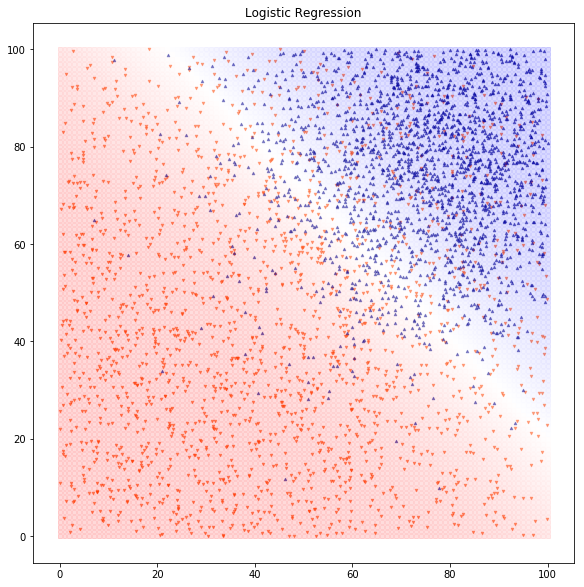

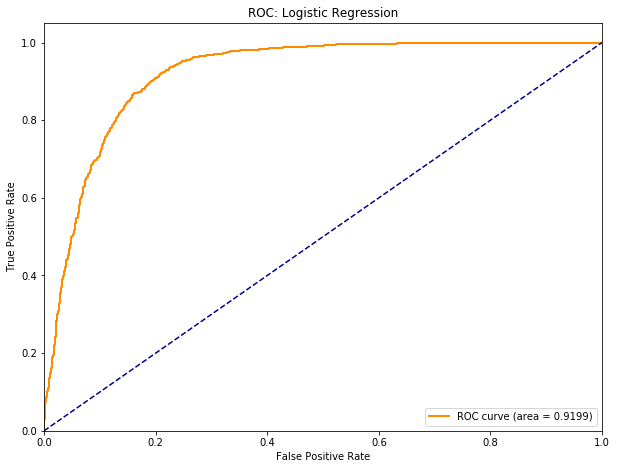

In [11]:
# Template for binary classification with training, CV, and test sets

estimator = LogisticRegression
est = estimator()
est.fit(X, y)
y_pred = est.predict(X)
print("In-Sample Accuracy (50%% threshold): %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
# select threshold using CV data to maximize accuracy
y_cv_pred_prob = est.predict_proba(X_cv)[:,1]
thresh = select_threshold(y_cv, y_cv_pred_prob, sklearn.metrics.accuracy_score)
y_cv_pred = y_cv_pred_prob > thresh
acc = sklearn.metrics.accuracy_score(y_cv, y_cv_pred)
f1_score = sklearn.metrics.f1_score(y_cv, y_cv_pred)
print("CV Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

# evaluate estimator using test data
y_test_pred_prob = est.predict_proba(X_test)[:,1]
y_test_pred = y_test_pred_prob > thresh
print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
print("Confusion Matrix:")
conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
print (conf_mat)
print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred, digits=4))

z = est.predict_proba(X_pred)
Z = np.hstack([X_pred, z])
class_chart_matplotlib(class1_test, class2_test, Z, "Logistic Regression", bgsize=15)   
roc_chart(est, X_test, y_test, "ROC: Logistic Regression")


In [12]:
# list all classifiers that support predict_proba 
estimators = []

for name, class_ in all_estimators():
    if issubclass(class_, sklearn.base.ClassifierMixin):
        if hasattr(class_, 'predict_proba'):
            print(class_)
            estimators.append(class_)
estimators

<class 'sklearn.ensemble.weight_boosting.AdaBoostClassifier'>
<class 'sklearn.ensemble.bagging.BaggingClassifier'>
<class 'sklearn.naive_bayes.BernoulliNB'>
<class 'sklearn.calibration.CalibratedClassifierCV'>
<class 'sklearn.tree.tree.DecisionTreeClassifier'>
<class 'sklearn.tree.tree.ExtraTreeClassifier'>
<class 'sklearn.ensemble.forest.ExtraTreesClassifier'>
<class 'sklearn.naive_bayes.GaussianNB'>
<class 'sklearn.gaussian_process.gpc.GaussianProcessClassifier'>
<class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>
<class 'sklearn.neighbors.classification.KNeighborsClassifier'>
<class 'sklearn.semi_supervised.label_propagation.LabelPropagation'>
<class 'sklearn.semi_supervised.label_propagation.LabelSpreading'>
<class 'sklearn.discriminant_analysis.LinearDiscriminantAnalysis'>
<class 'sklearn.linear_model.logistic.LogisticRegression'>
<class 'sklearn.linear_model.logistic.LogisticRegressionCV'>
<class 'sklearn.neural_network.multilayer_perceptron.MLPClassifier'>
<c

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/grid_search.py:42: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/learning_curve.py:22: DeprecationWarning:

T

[sklearn.ensemble.weight_boosting.AdaBoostClassifier,
 sklearn.ensemble.bagging.BaggingClassifier,
 sklearn.naive_bayes.BernoulliNB,
 sklearn.calibration.CalibratedClassifierCV,
 sklearn.tree.tree.DecisionTreeClassifier,
 sklearn.tree.tree.ExtraTreeClassifier,
 sklearn.ensemble.forest.ExtraTreesClassifier,
 sklearn.naive_bayes.GaussianNB,
 sklearn.gaussian_process.gpc.GaussianProcessClassifier,
 sklearn.ensemble.gradient_boosting.GradientBoostingClassifier,
 sklearn.neighbors.classification.KNeighborsClassifier,
 sklearn.semi_supervised.label_propagation.LabelPropagation,
 sklearn.semi_supervised.label_propagation.LabelSpreading,
 sklearn.discriminant_analysis.LinearDiscriminantAnalysis,
 sklearn.linear_model.logistic.LogisticRegression,
 sklearn.linear_model.logistic.LogisticRegressionCV,
 sklearn.neural_network.multilayer_perceptron.MLPClassifier,
 sklearn.naive_bayes.MultinomialNB,
 sklearn.svm.classes.NuSVC,
 sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis,
 sklearn.ens

In [13]:
# Wrappers for some non-sklearn models 
# and some sklearn models that need custom params

def myNuSVC():
    # needs probability=True
    return sklearn.svm.classes.NuSVC(probability=True)

def mySGDClassifierLog():
    # needs loss="log"
    return sklearn.linear_model.stochastic_gradient.SGDClassifier(loss="log", max_iter=1000, tol=1e-4)

def mySVC():
    # needs probability=True
    return sklearn.svm.classes.SVC(probability=True)

def myXGBClassifier(n_estimators=1000, max_depth=4, subsample=0.7, learning_rate=0.001):
    # needs nthreads=-1
    def create_model():
        return xgboost.sklearn.XGBClassifier(n_estimators=n_estimators, max_depth=max_depth, subsample=subsample, learning_rate=learning_rate, nthreads=-1)
    return create_model

def myCatBoostClassifier():
    def create_model():
        #return catboost.CatBoostClassifier(iterations=n_estimators, learning_rate=learning_rate, depth=max_depth, rsm=subsample, 
        #                                   thread_count=6, loss_function='MultiClass', task_type='CPU', logging_level='Silent')
        return catboost.CatBoostClassifier(loss_function='MultiClass', task_type='CPU', logging_level='Silent')
    return create_model

def myLGBMClassifier():
    def create_model():
        return lgb.LGBMClassifier(silent=True)
    return create_model

# statsmodels use a different interface from sklearn and I don't see a wrapper, so here's a wrapper
class SMwrapper:
    def __init__(self, smclass):
        self.smclass = smclass
        self.model=None
        self.result=None

    def fit(self, X, y_class):
        # statsmodels need an explicit intercept
        intercept = np.array([1] * len(X)).reshape(len(X),1)
        X = np.hstack([X,intercept])
        self.model = self.smclass(y_class, X)
        self.result = self.model.fit()
        
    def predict_proba(self, X_pred):
        intercept = np.array([1] * len(X_pred)).reshape(len(X_pred),1)
        X_pred = np.hstack([X_pred,intercept])
        self.y_pred_proba = self.result.predict(X_pred)
        retarray = np.array([1-self.y_pred_proba, self.y_pred_proba]).T        
        return retarray

    def predict(self, X_pred):
        intercept = np.array([1] * len(X_pred)).reshape(len(X_pred),1)
        X_pred = np.hstack([X_pred,intercept])
        self.y_pred_proba = self.result.predict(X_pred)
        #print("median %f" % np.median(self.y_pred_proba))
        #y_pred = self.y_pred_proba > np.median(self.y_pred_proba)
        y_pred = self.y_pred_proba > 0.5
        return y_pred
    
def statsmodels_wrapper(smclass):
    def create_smwrapper():
        return SMwrapper(smclass)
    return create_smwrapper

EPOCHS=1000
INPUT_DIM=2
def myKerasClassifier(n_hidden_layers = 2,
                      hidden_layer_size = 16,
                      reg_penalty = 0.01,
                      epochs=EPOCHS,
                      verbose=True):
    
        main_input = Input(shape=(INPUT_DIM,),
                           dtype='float32', 
                           name='main_input')
        lastlayer=main_input
        
        for i in range(n_hidden_layers):
            if verbose:
                print("layer %d size %d, reg_penalty %.8f" % (i + 1, 
                                                              hidden_layer_size, 
                                                              reg_penalty, 
                                                             ))
            lastlayer = Dense(units = hidden_layer_size, 
                              activation = 'relu',
                              kernel_initializer = keras.initializers.glorot_uniform(),
                              kernel_regularizer=keras.regularizers.l1_l2(reg_penalty),
                              name = "Dense%02d" % i)(lastlayer)
            
        output = Dense(1, activation='sigmoid')(lastlayer)            
        model = Model(inputs=[main_input], outputs=[output])
        if verbose:
            print(model.summary())

        model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
        
        return model
    
def modelFactory(n_hidden_layers = 2,
                 hidden_layer_size = 16,
                 reg_penalty = 0.01,
                           epochs=EPOCHS,
                           verbose=True):
    def create_fn():
        return myKerasClassifier(n_hidden_layers,
                                 hidden_layer_size,
                                 reg_penalty,
                                 epochs,
                                 verbose)
    return create_fn

# KerasClassifier wraps a Keras model with an sklearn interface
# But it returns wrong shape for VotingClassifier ensemble
# 2D shape (nrows,1) instead of 1D (nrows) 
# Subclass KerasClassifier and override predict  

class monkeyKerasClassifier(KerasClassifier):
    """subclass KerasClassifier and override predict to work with VotingClassifier"""
    def __init__(self, *args, **kwargs):
        super(KerasClassifier, self).__init__(*args, **kwargs)        
        
    def predict(self, x, **kwargs):
        # this should work but nope
        # pred = KerasClassifier.predict(self, x, **kwargs)
        # return pred[:, 0]
        
        pred = self.model.predict(x, **kwargs)
        return np.round(pred[:,0])        

    def predict_proba(self, x, **kwargs):
        pred = self.model.predict(x, **kwargs)
        return np.vstack([1-pred[:,0], pred[:,0]]).T
    
def kerasClassifierFactory(n_hidden_layers = 2,
                           hidden_layer_size = 16,
                           reg_penalty = 0.01,
                           epochs=EPOCHS,
                           verbose=True):
    def create_fn():
        return monkeyKerasClassifier(build_fn=modelFactory(n_hidden_layers,
                                                     hidden_layer_size,
                                                     reg_penalty,
                                                     epochs,
                                                     verbose), 
                               epochs=EPOCHS, 
                               batch_size=100, 
                               verbose=0)
    return create_fn


layer 1 size 16, reg_penalty 0.01000000
layer 2 size 16, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
Dense01 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8618
Out-Of-Sample Accuracy: 0.8660
Confusion Matrix:
[[1590  410]
 [ 126 1874]]
(True negative 1590 True positive 1874 False positive 126 False negative 410)
AUC: 0.926

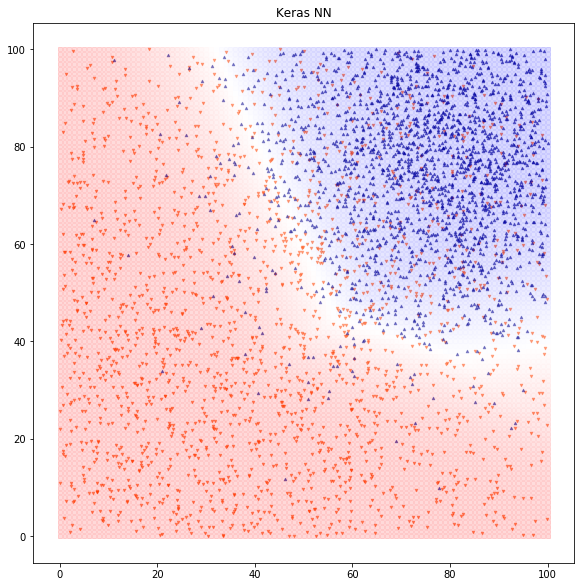

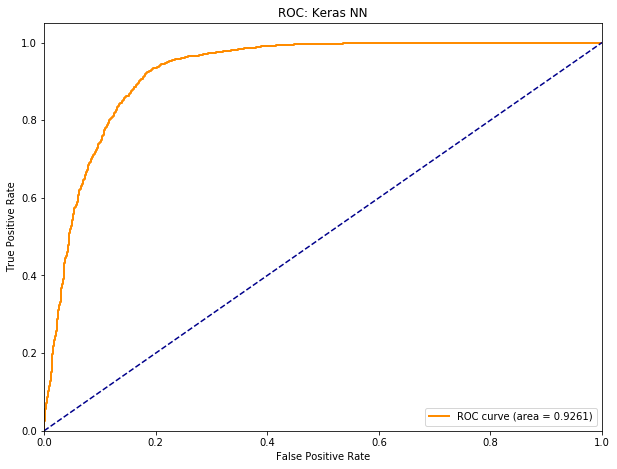

In [14]:
model = kerasClassifierFactory()()
#print(dir(model))
model.fit(X,y)

y_pred = model.predict(X)
print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
y_test_pred = model.predict(X_test)
print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
print("Confusion Matrix:")
conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
print (conf_mat)
print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

z = model.predict_proba(X_pred)
if len(z.shape) == 1:
    z = z.reshape(z.shape[0], 1)

Z = np.hstack([X_pred, z])
class_chart_matplotlib(class1_test, class2_test, Z, "Keras NN", bgsize=15)    
roc_chart(model, X_test, y_test, "ROC: Keras NN")

08:29:24 Running experiment 1 of 90
(1, 4, 0)
layer 1 size 4, reg_penalty 0.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8608
Out-Of-Sample Accuracy: 0.8665
Confusion Matrix:
[[1627  373]
 [ 161 1839]]
(True negative 1627 True positive 1839 False positive 161 False negative 373)
AUC: 0.9253


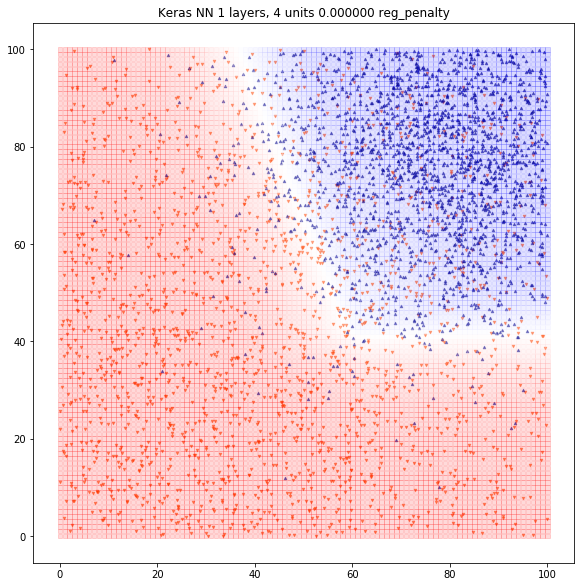

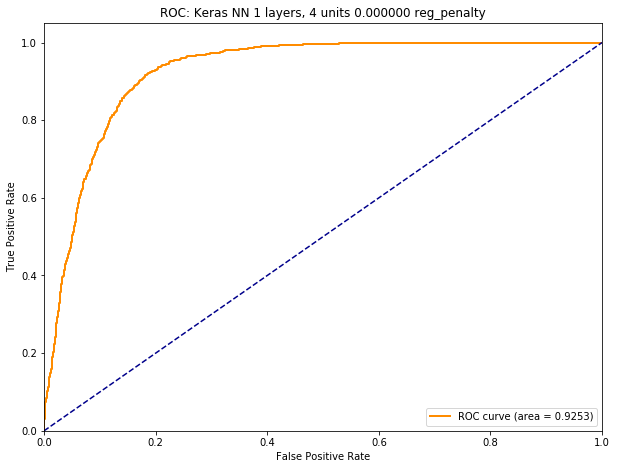


############################################################

08:32:19 Running experiment 2 of 90
(1, 4, 0.0001)
layer 1 size 4, reg_penalty 0.00010000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8592
Out-Of-Sample Accuracy: 0.8615
Confusion Matrix:
[[1567  433]
 [ 121 1879]]
(True negative 1567 True positive 1879 False positive 121 False negative 433)
AUC: 0.9256


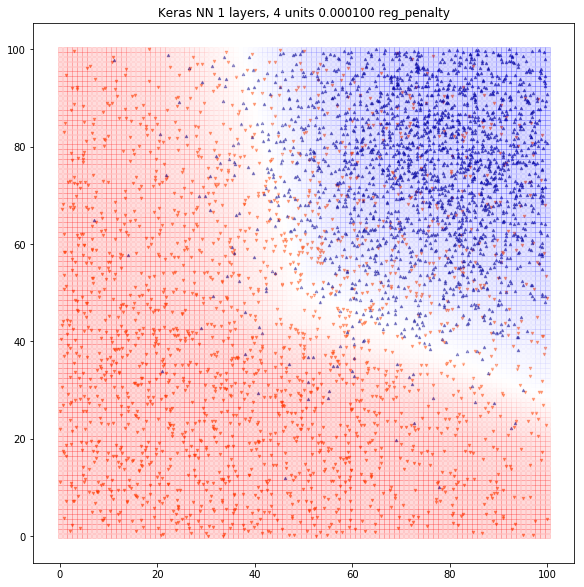

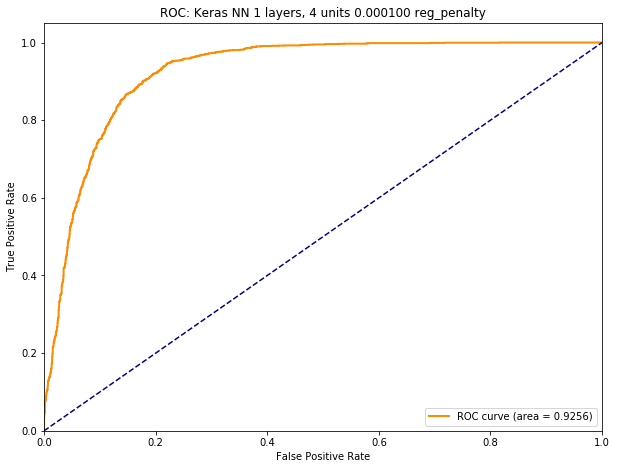


############################################################

08:35:16 Running experiment 3 of 90
(1, 4, 0.001)
layer 1 size 4, reg_penalty 0.00100000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8478
Out-Of-Sample Accuracy: 0.8542
Confusion Matrix:
[[1726  274]
 [ 309 1691]]
(True negative 1726 True positive 1691 False positive 309 False negative 274)
AUC: 0.9250


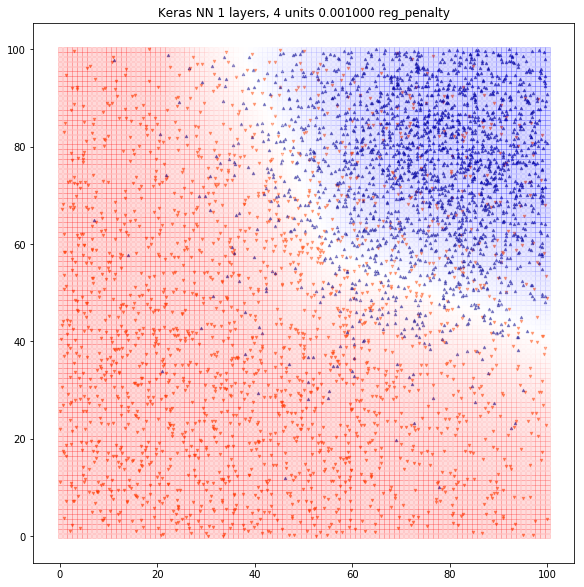

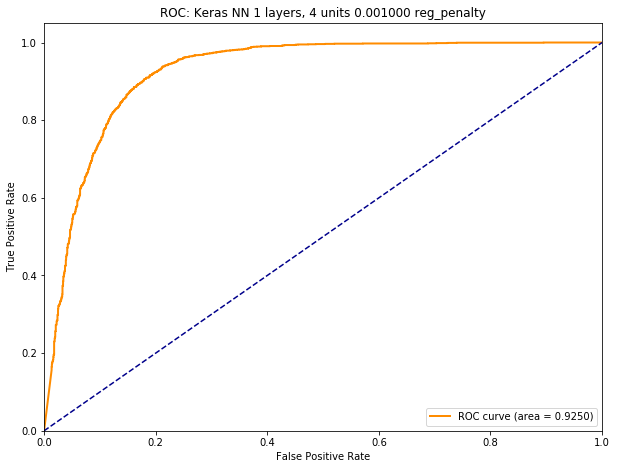


############################################################

08:38:13 Running experiment 4 of 90
(1, 4, 0.01)
layer 1 size 4, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8545
Out-Of-Sample Accuracy: 0.8590
Confusion Matrix:
[[1684  316]
 [ 248 1752]]
(True negative 1684 True positive 1752 False positive 248 False negative 316)
AUC: 0.9261


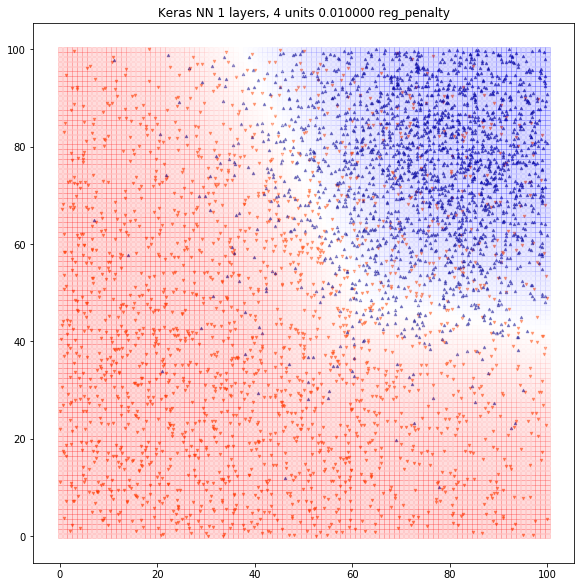

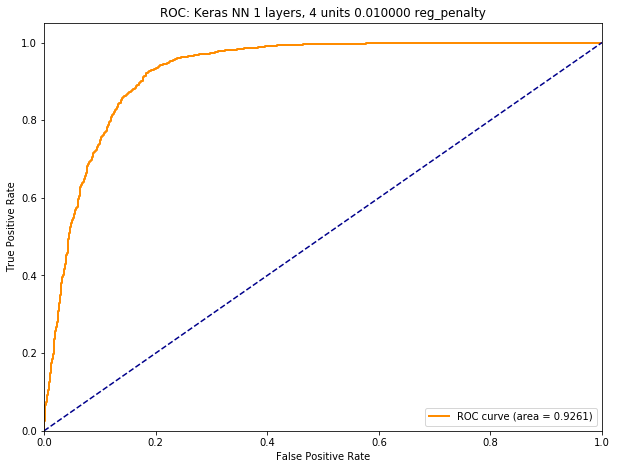


############################################################

08:41:11 Running experiment 5 of 90
(1, 4, 0.1)
layer 1 size 4, reg_penalty 0.10000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8578
Out-Of-Sample Accuracy: 0.8630
Confusion Matrix:
[[1626  374]
 [ 174 1826]]
(True negative 1626 True positive 1826 False positive 174 False negative 374)
AUC: 0.9205


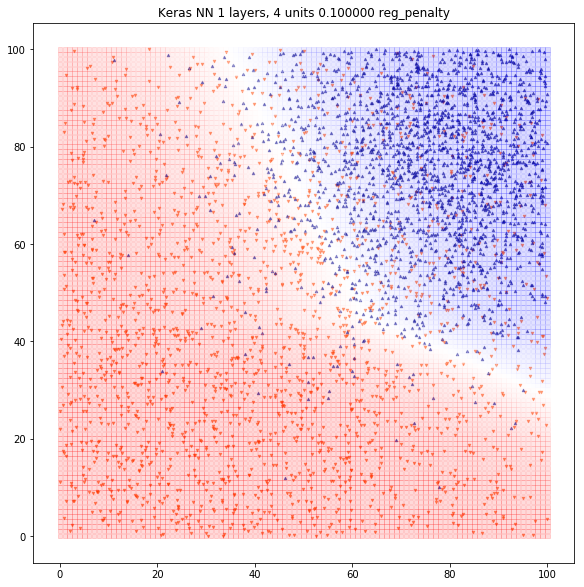

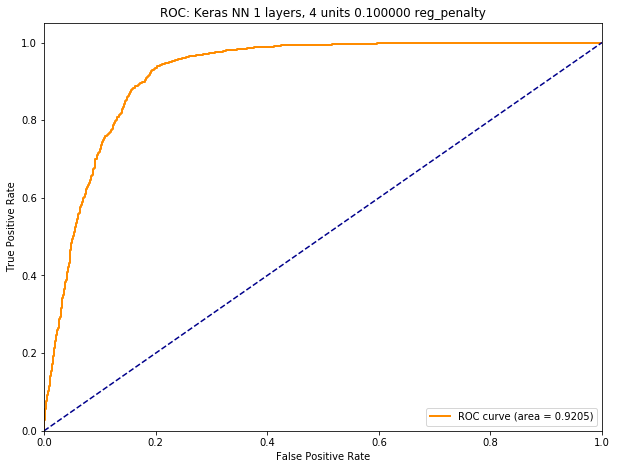


############################################################

08:44:10 Running experiment 6 of 90
(1, 4, 1)
layer 1 size 4, reg_penalty 1.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 4)                 12        
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 5         
Total params: 17
Trainable params: 17
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8510
Out-Of-Sample Accuracy: 0.8595
Confusion Matrix:
[[1575  425]
 [ 137 1863]]
(True negative 1575 True positive 1863 False positive 137 False negative 425)
AUC: 0.9222


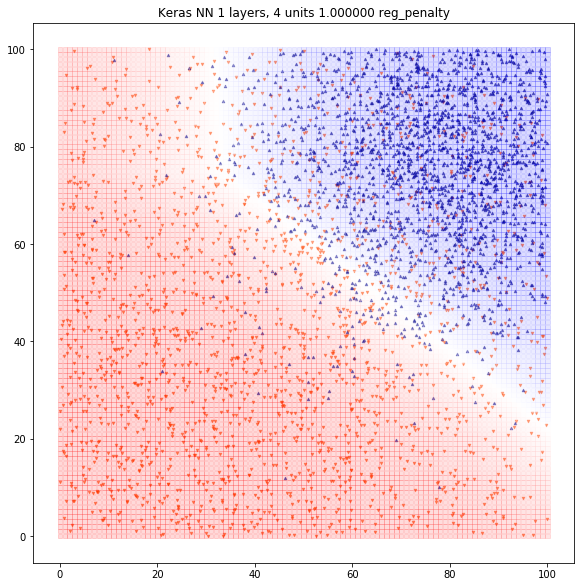

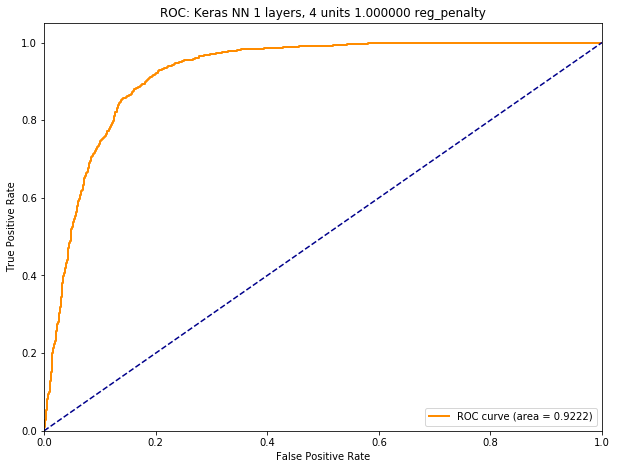


############################################################

08:47:07 Running experiment 7 of 90
(1, 8, 0)
layer 1 size 8, reg_penalty 0.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8598
Out-Of-Sample Accuracy: 0.8605
Confusion Matrix:
[[1562  438]
 [ 120 1880]]
(True negative 1562 True positive 1880 False positive 120 False negative 438)
AUC: 0.9257


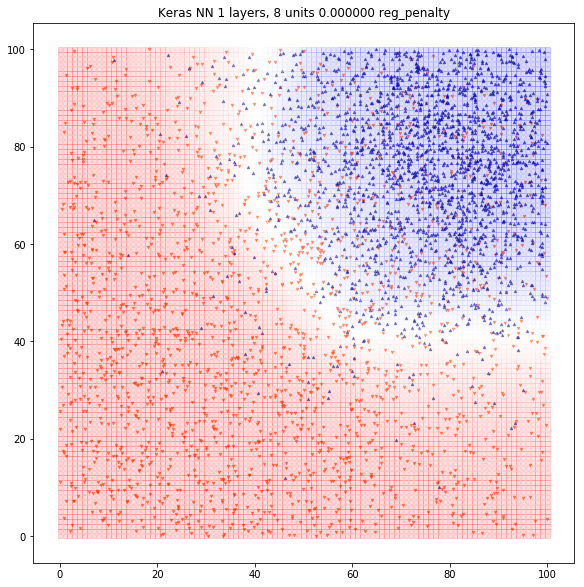

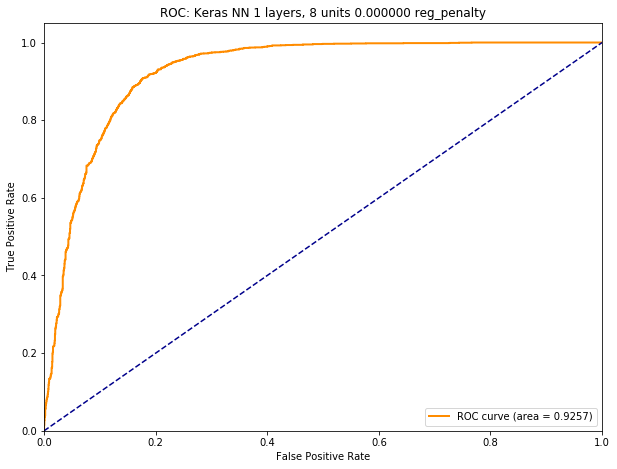


############################################################

08:50:03 Running experiment 8 of 90
(1, 8, 0.0001)
layer 1 size 8, reg_penalty 0.00010000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8600
Out-Of-Sample Accuracy: 0.8625
Confusion Matrix:
[[1579  421]
 [ 129 1871]]
(True negative 1579 True positive 1871 False positive 129 False negative 421)
AUC: 0.9249


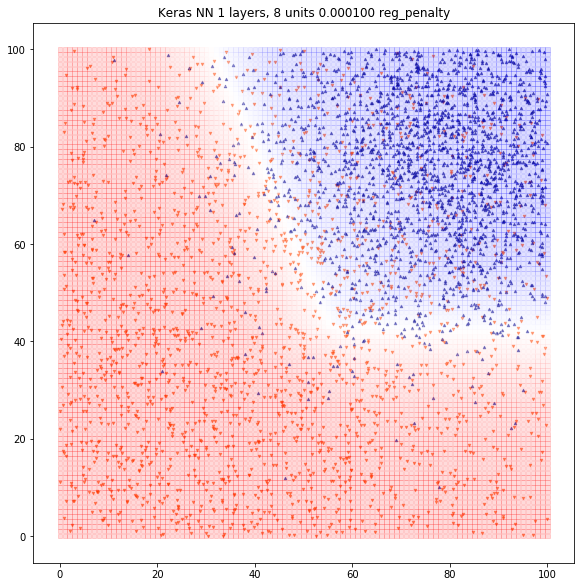

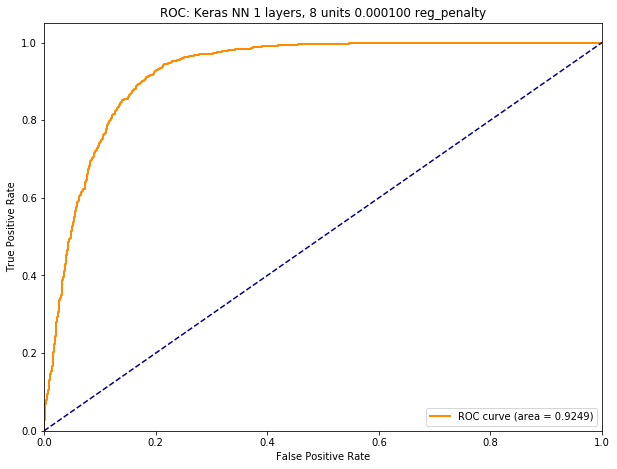


############################################################

08:53:03 Running experiment 9 of 90
(1, 8, 0.001)
layer 1 size 8, reg_penalty 0.00100000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8608
Out-Of-Sample Accuracy: 0.8632
Confusion Matrix:
[[1631  369]
 [ 178 1822]]
(True negative 1631 True positive 1822 False positive 178 False negative 369)
AUC: 0.9261


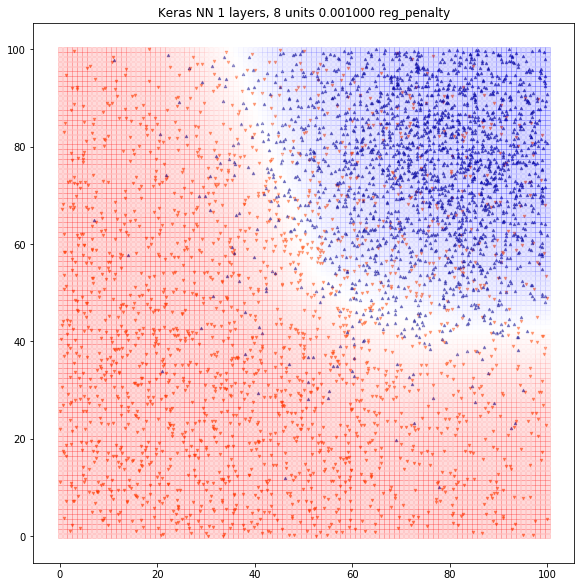

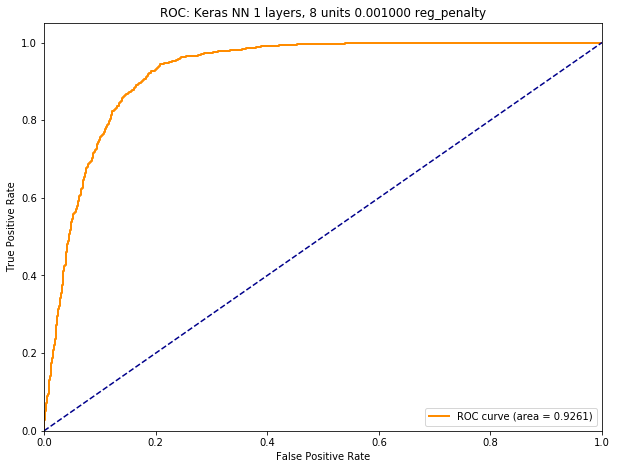


############################################################

08:56:03 Running experiment 10 of 90
(1, 8, 0.01)
layer 1 size 8, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8608
Out-Of-Sample Accuracy: 0.8640
Confusion Matrix:
[[1576  424]
 [ 120 1880]]
(True negative 1576 True positive 1880 False positive 120 False negative 424)
AUC: 0.9262


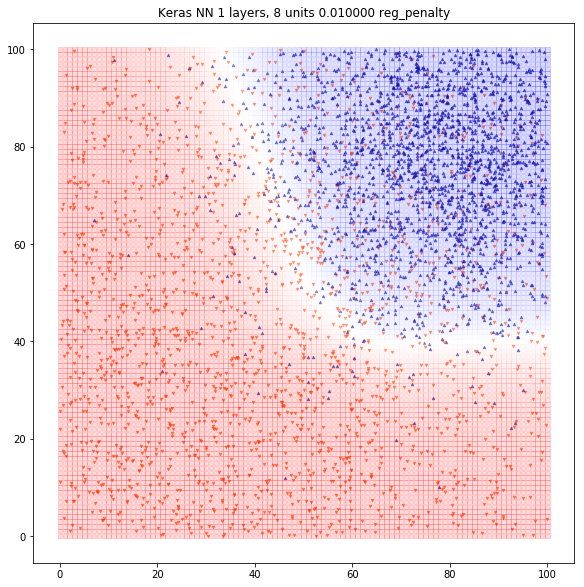

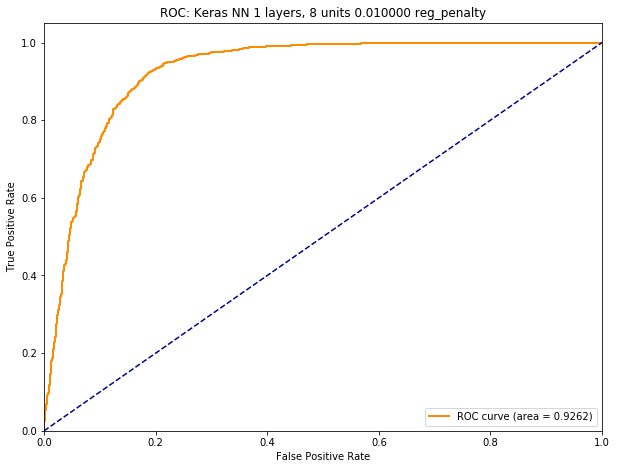


############################################################

08:59:01 Running experiment 11 of 90
(1, 8, 0.1)
layer 1 size 8, reg_penalty 0.10000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8620
Out-Of-Sample Accuracy: 0.8635
Confusion Matrix:
[[1585  415]
 [ 131 1869]]
(True negative 1585 True positive 1869 False positive 131 False negative 415)
AUC: 0.9256


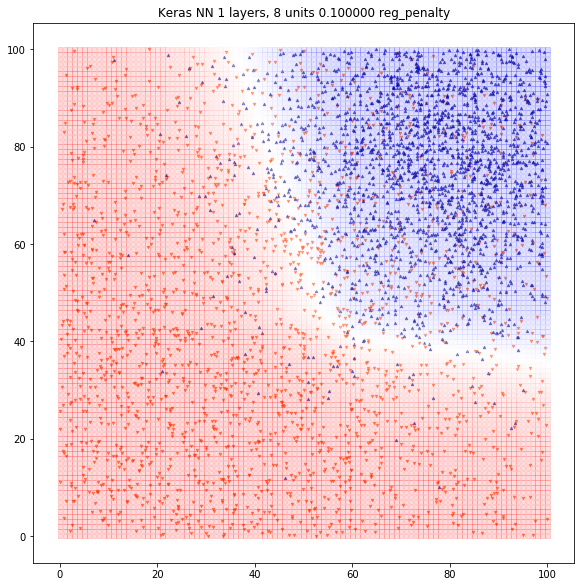

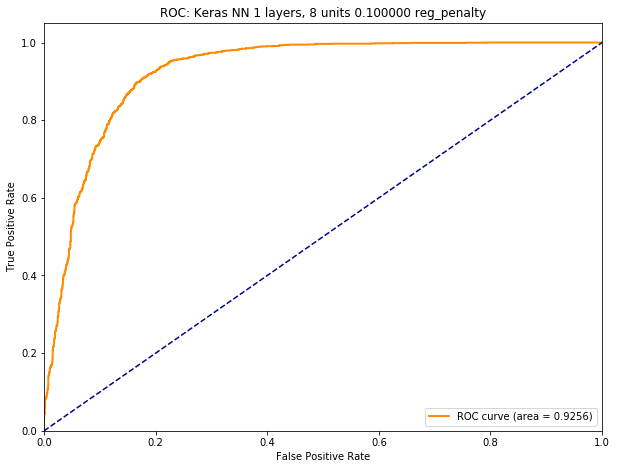


############################################################

09:02:02 Running experiment 12 of 90
(1, 8, 1)
layer 1 size 8, reg_penalty 1.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 8)                 24        
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 9         
Total params: 33
Trainable params: 33
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8598
Out-Of-Sample Accuracy: 0.8648
Confusion Matrix:
[[1575  425]
 [ 116 1884]]
(True negative 1575 True positive 1884 False positive 116 False negative 425)
AUC: 0.9256


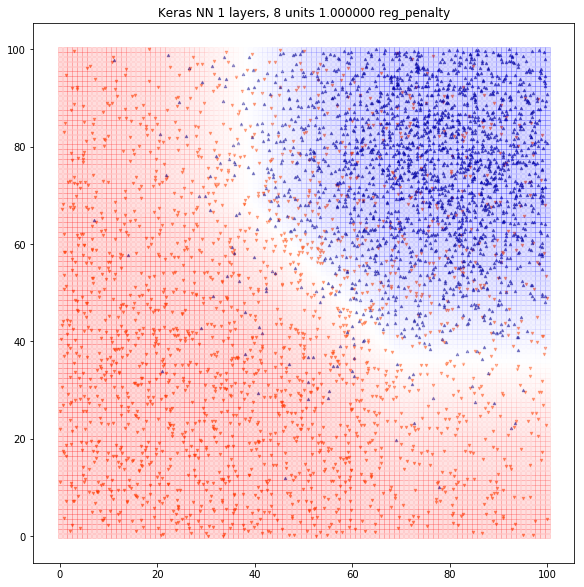

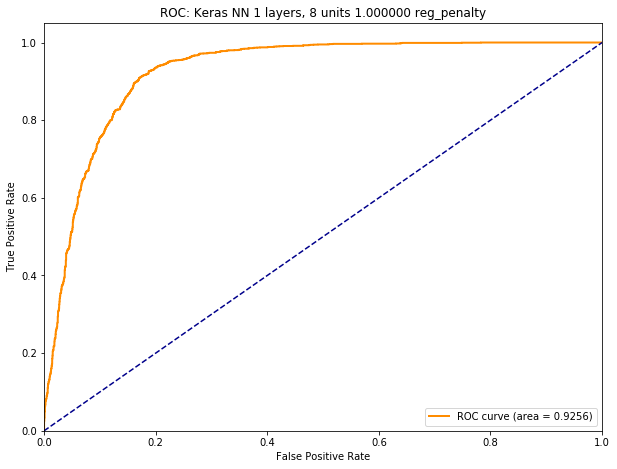


############################################################

09:05:02 Running experiment 13 of 90
(1, 16, 0)
layer 1 size 16, reg_penalty 0.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8618
Out-Of-Sample Accuracy: 0.8638
Confusion Matrix:
[[1583  417]
 [ 128 1872]]
(True negative 1583 True positive 1872 False positive 128 False negative 417)
AUC: 0.9258


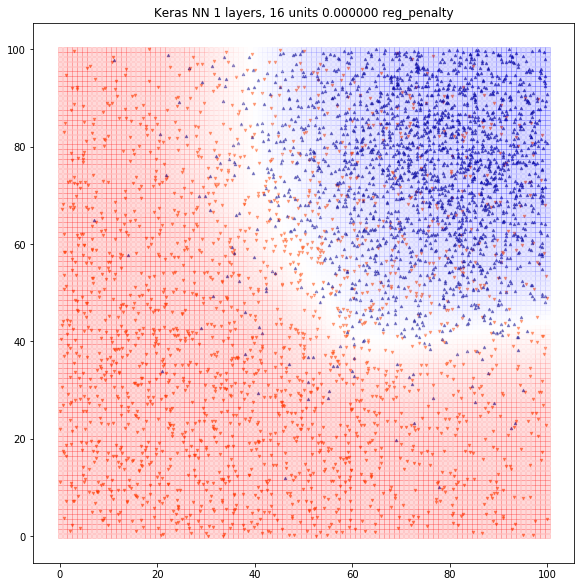

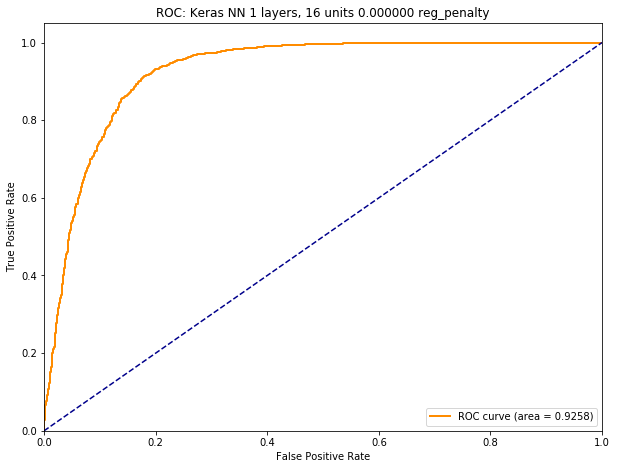


############################################################

09:08:00 Running experiment 14 of 90
(1, 16, 0.0001)
layer 1 size 16, reg_penalty 0.00010000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8618
Out-Of-Sample Accuracy: 0.8655
Confusion Matrix:
[[1593  407]
 [ 131 1869]]
(True negative 1593 True positive 1869 False positive 131 False negative 407)
AUC: 0.9264


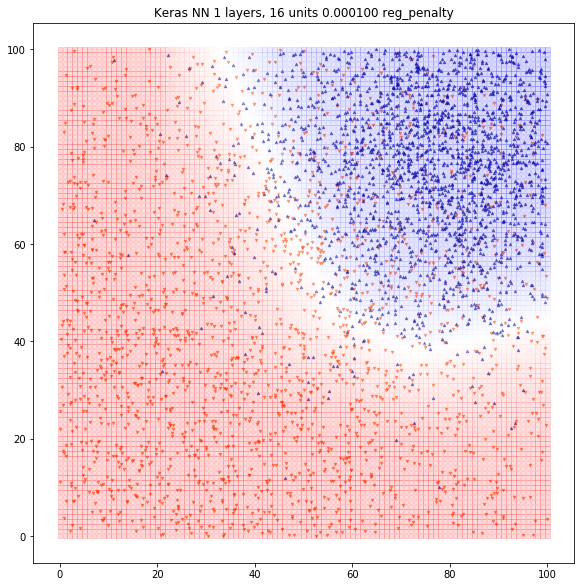

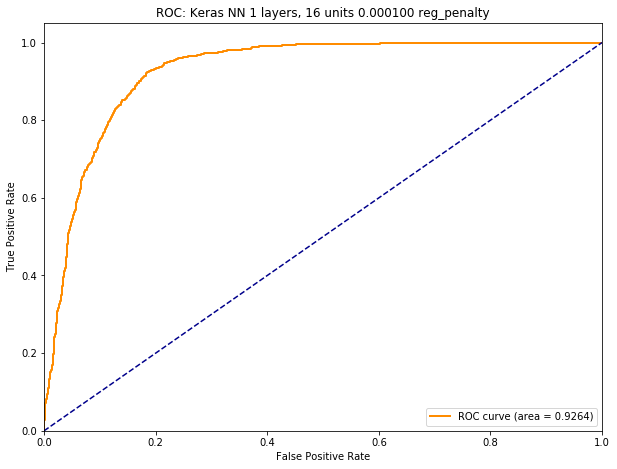


############################################################

09:11:01 Running experiment 15 of 90
(1, 16, 0.001)
layer 1 size 16, reg_penalty 0.00100000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8608
Out-Of-Sample Accuracy: 0.8680
Confusion Matrix:
[[1629  371]
 [ 157 1843]]
(True negative 1629 True positive 1843 False positive 157 False negative 371)
AUC: 0.9262


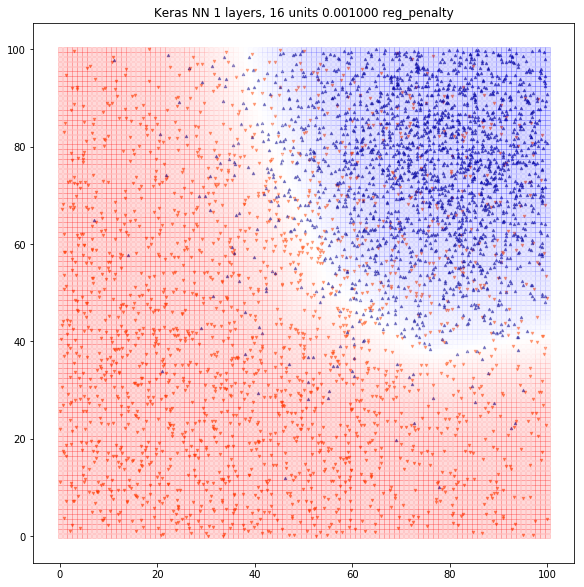

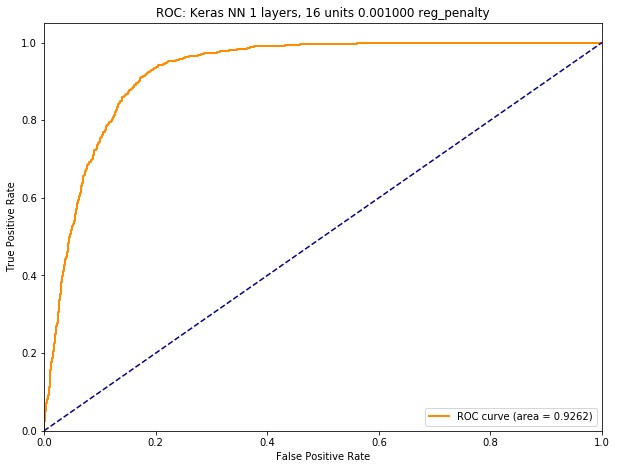


############################################################

09:14:02 Running experiment 16 of 90
(1, 16, 0.01)
layer 1 size 16, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8578
Out-Of-Sample Accuracy: 0.8640
Confusion Matrix:
[[1657  343]
 [ 201 1799]]
(True negative 1657 True positive 1799 False positive 201 False negative 343)
AUC: 0.9256


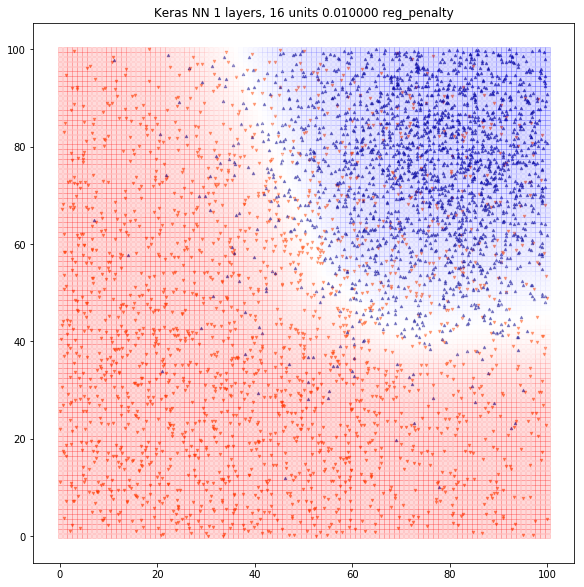

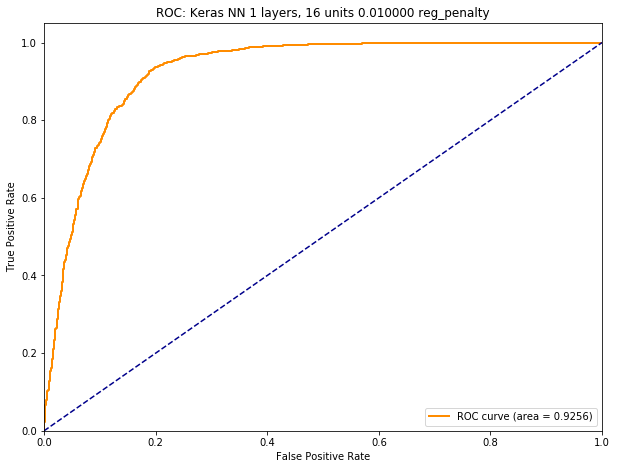


############################################################

09:17:04 Running experiment 17 of 90
(1, 16, 0.1)
layer 1 size 16, reg_penalty 0.10000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8598
Out-Of-Sample Accuracy: 0.8645
Confusion Matrix:
[[1667  333]
 [ 209 1791]]
(True negative 1667 True positive 1791 False positive 209 False negative 333)
AUC: 0.9262


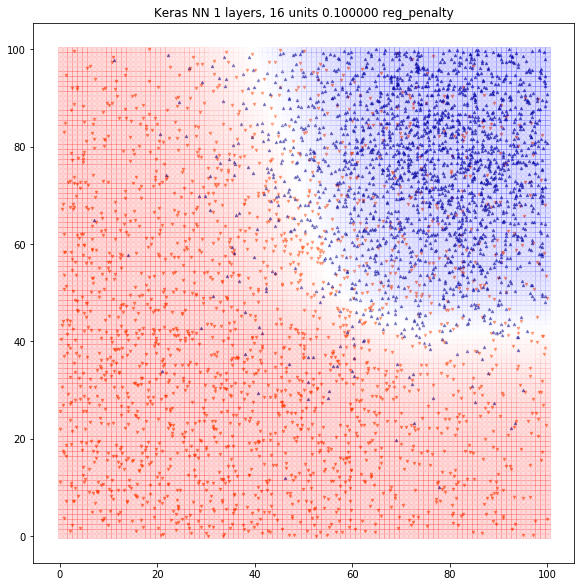

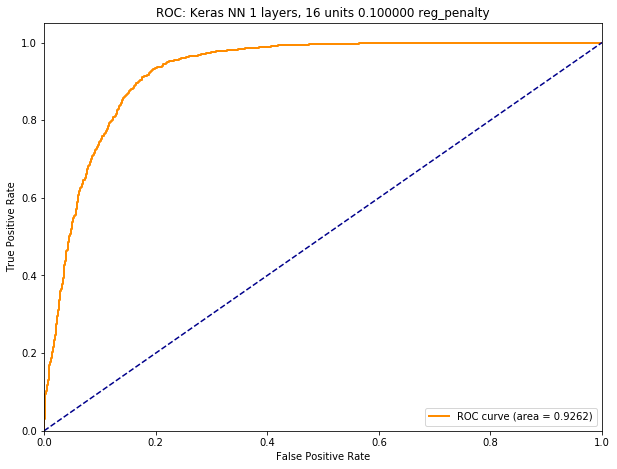


############################################################

09:20:05 Running experiment 18 of 90
(1, 16, 1)
layer 1 size 16, reg_penalty 1.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 17        
Total params: 65
Trainable params: 65
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8572
Out-Of-Sample Accuracy: 0.8645
Confusion Matrix:
[[1577  423]
 [ 119 1881]]
(True negative 1577 True positive 1881 False positive 119 False negative 423)
AUC: 0.9252


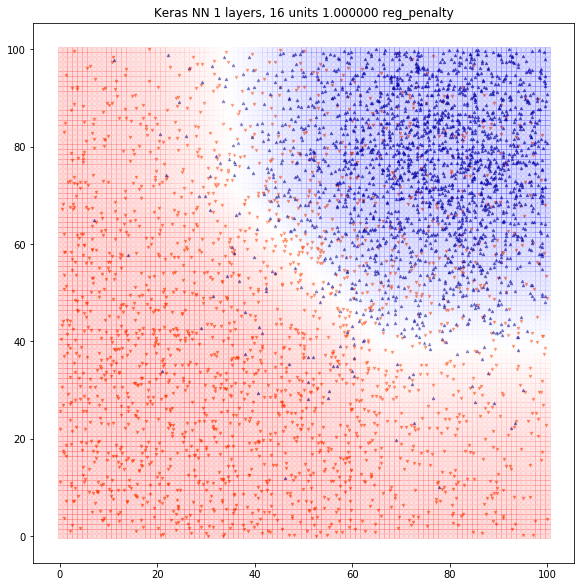

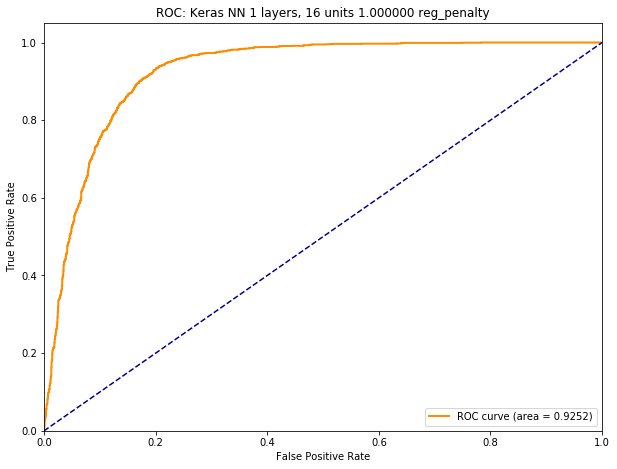


############################################################

09:23:07 Running experiment 19 of 90
(1, 32, 0)
layer 1 size 32, reg_penalty 0.00000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 33        
Total params: 129
Trainable params: 129
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8568
Out-Of-Sample Accuracy: 0.8632
Confusion Matrix:
[[1679  321]
 [ 226 1774]]
(True negative 1679 True positive 1774 False positive 226 False negative 321)
AUC: 0.9266


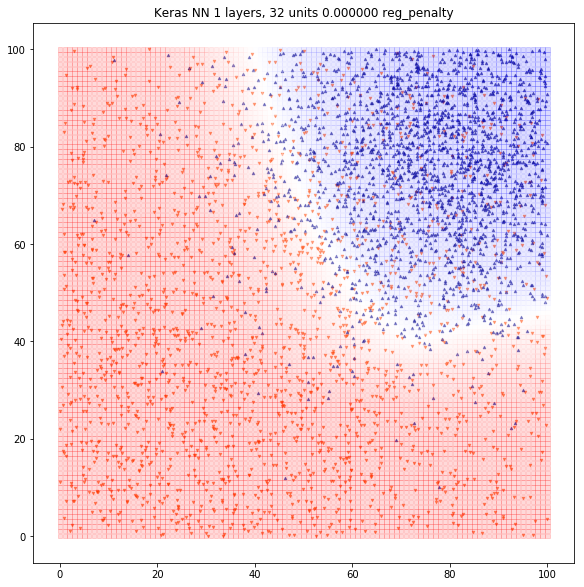

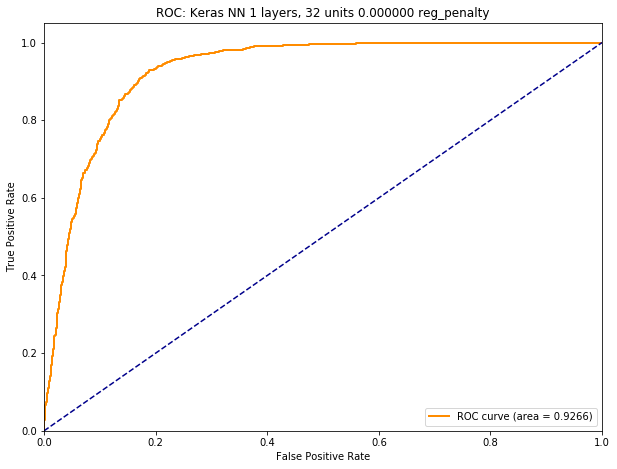


############################################################

09:26:07 Running experiment 20 of 90
(1, 32, 0.0001)
layer 1 size 32, reg_penalty 0.00010000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 33        
Total params: 129
Trainable params: 129
Non-trainable params: 0
_________________________________________________________________
None


KeyboardInterrupt: 

In [15]:
# cross-validate a bunch of keras models
n_layers = [1, 2, 3]
hidden_layer_sizes = [4, 8, 16, 32, 64]
reg_penaltys = [0, 0.0001, 0.001, 0.01, 0.1, 1]

hyperparameter_combos = list(product(n_layers, hidden_layer_sizes, reg_penaltys))

keys = []
for counter, param_list in enumerate(hyperparameter_combos):
    n_hidden_layers, hidden_layer_size, reg_penalty = param_list
    est = kerasClassifierFactory(n_hidden_layers=n_hidden_layers,
                                   hidden_layer_size=hidden_layer_size,
                                   reg_penalty=reg_penalty)()

    print("%s Running experiment %d of %d" % (time.strftime("%H:%M:%S"), counter+1, len(hyperparameter_combos)))
    key = (n_hidden_layers, hidden_layer_size, reg_penalty)
    print(key)
    keys.append(key)
    est.fit(X, y)
    y_pred = est.predict(X)
    print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
    y_test_pred = est.predict(X_test)
    print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
    print("Confusion Matrix:")
    conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
    print (conf_mat)
    print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

    z = est.predict_proba(X_pred)
    if len(z.shape) == 1:
        z = z.reshape(z.shape[0], 1)

    Z = np.hstack([X_pred, z])
    estname="Keras NN %d layers, %d units %f reg_penalty" % (n_hidden_layers, hidden_layer_size, reg_penalty)
    class_chart_matplotlib(class1_test, class2_test, Z, estname, bgsize=15)    
    roc_chart(est, X_test, y_test, "ROC: %s" % estname)
    print()
    print('############################################################')
    print()
    

############################################################
sklearn.linear_model.logistic.LogisticRegression
############################################################
In-Sample Accuracy: 0.8478
CV Threshold 0.4390 Accuracy 0.8608 F1 0.8679
Out-Of-Sample Accuracy: 0.8528
Confusion Matrix:
[[1589  411]
 [ 178 1822]]
(True negative 1589 True positive 1822 False positive 178 False negative 411)
AUC: 0.9199


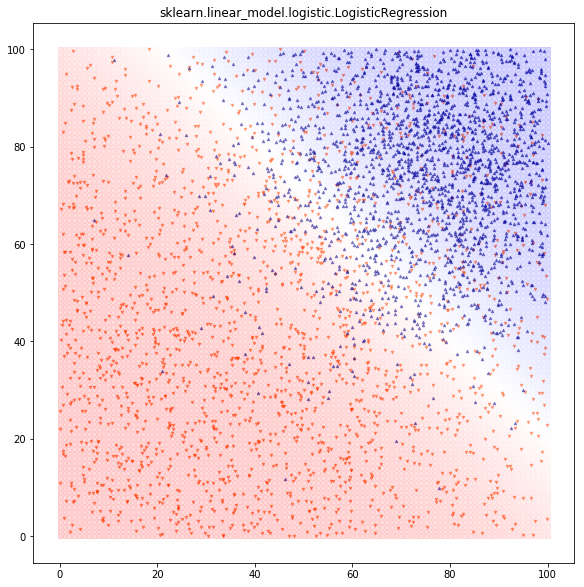

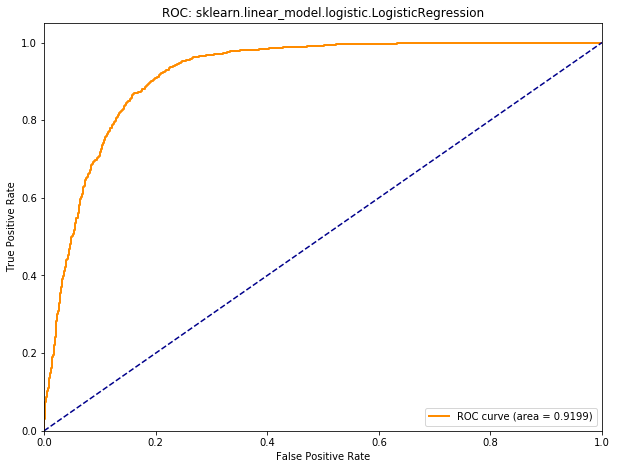


############################################################
sklearn.linear_model.logistic.LogisticRegressionCV
############################################################
In-Sample Accuracy: 0.8472
CV Threshold 0.4369 Accuracy 0.8608 F1 0.8679
Out-Of-Sample Accuracy: 0.8525
Confusion Matrix:
[[1588  412]
 [ 178 1822]]
(True negative 1588 True positive 1822 False positive 178 False negative 412)
AUC: 0.9199


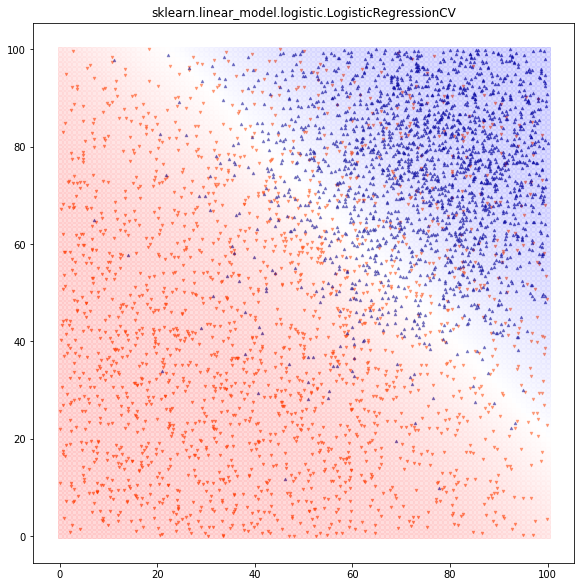

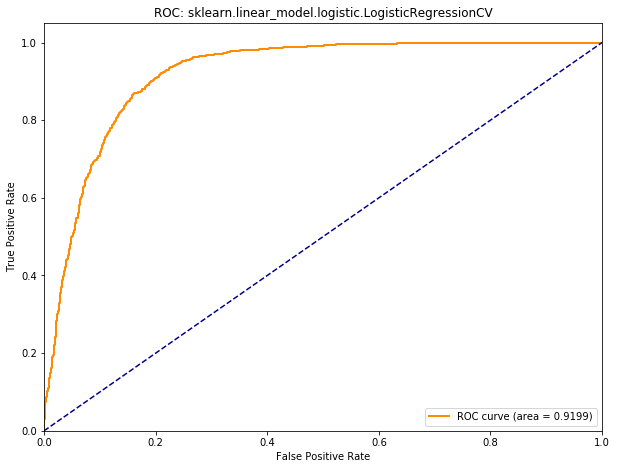


############################################################
sklearn.discriminant_analysis.LinearDiscriminantAnalysis
############################################################
In-Sample Accuracy: 0.8475
CV Threshold 0.4978 Accuracy 0.8612 F1 0.8686
Out-Of-Sample Accuracy: 0.8552
Confusion Matrix:
[[1590  410]
 [ 169 1831]]
(True negative 1590 True positive 1831 False positive 169 False negative 410)
AUC: 0.9198


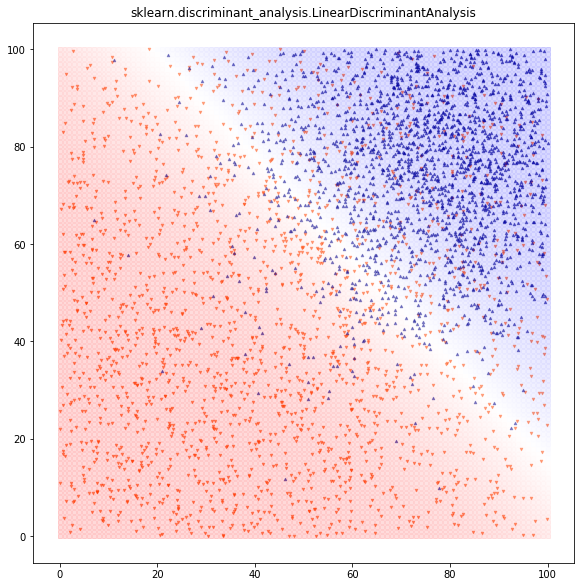

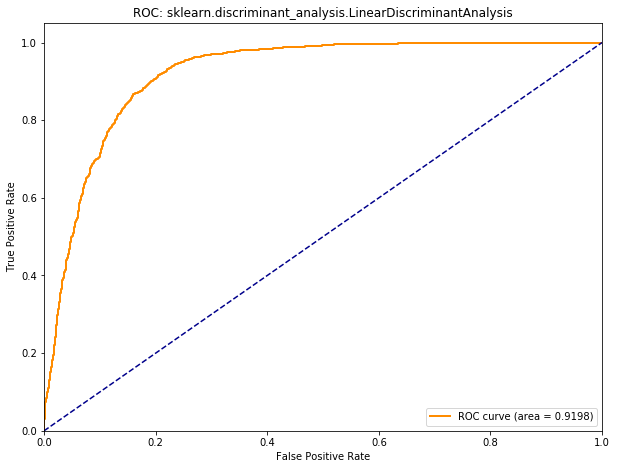


############################################################
statsmodels_wrapper.<locals>.create_smwrapper
############################################################
Optimization terminated successfully.
         Current function value: 0.359404
         Iterations 7
In-Sample Accuracy: 0.8472
CV Threshold 0.4455 Accuracy 0.8605 F1 0.8667
Out-Of-Sample Accuracy: 0.8535
Confusion Matrix:
[[1606  394]
 [ 192 1808]]
(True negative 1606 True positive 1808 False positive 192 False negative 394)
AUC: 0.9199


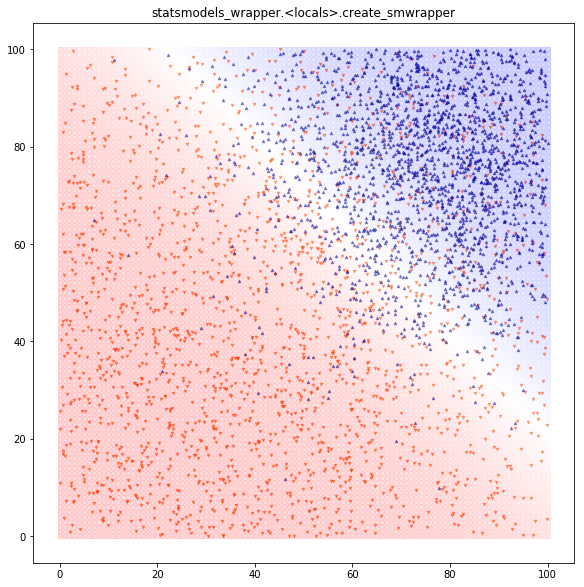

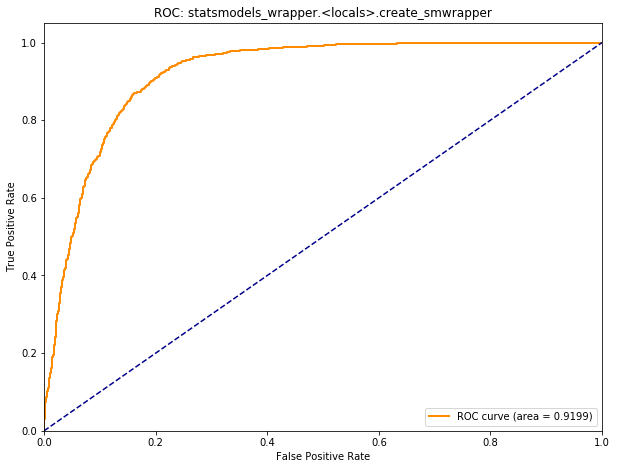


############################################################
statsmodels_wrapper.<locals>.create_smwrapper
############################################################
Optimization terminated successfully.
         Current function value: 0.360494
         Iterations 7
In-Sample Accuracy: 0.8472
CV Threshold 0.4302 Accuracy 0.8605 F1 0.8678
Out-Of-Sample Accuracy: 0.8530
Confusion Matrix:
[[1588  412]
 [ 176 1824]]
(True negative 1588 True positive 1824 False positive 176 False negative 412)
AUC: 0.9199


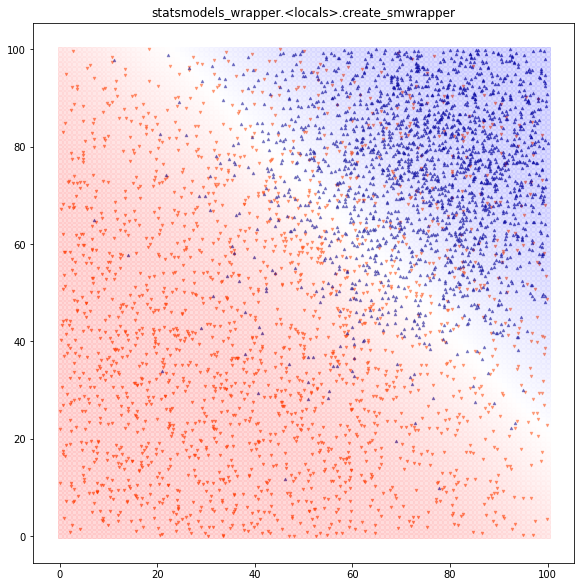

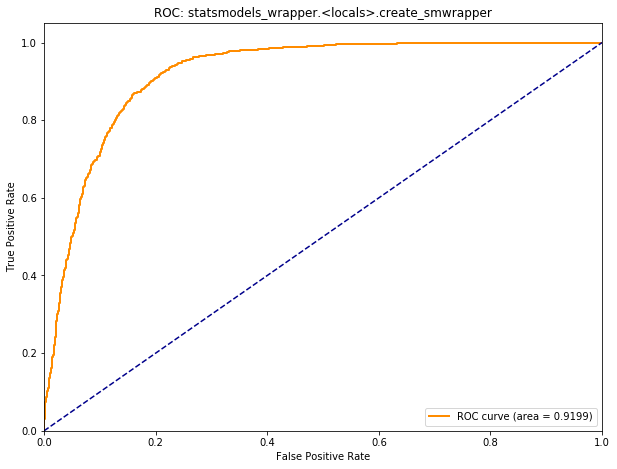


############################################################
sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis
############################################################
In-Sample Accuracy: 0.8588
CV Threshold 0.4965 Accuracy 0.8720 F1 0.8760
Out-Of-Sample Accuracy: 0.8652
Confusion Matrix:
[[1659  341]
 [ 198 1802]]
(True negative 1659 True positive 1802 False positive 198 False negative 341)
AUC: 0.9262


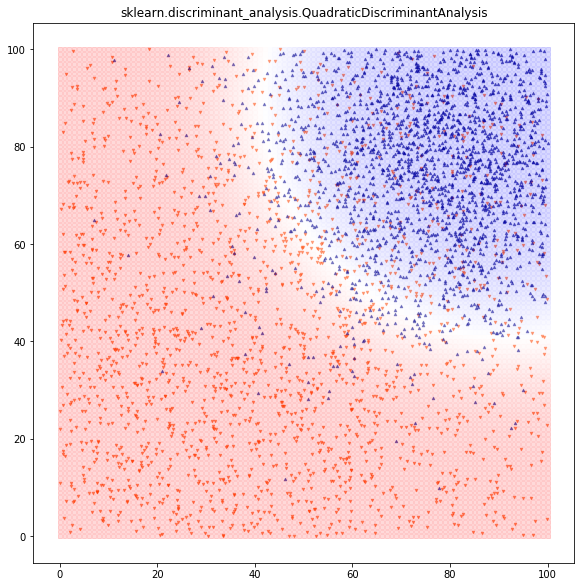

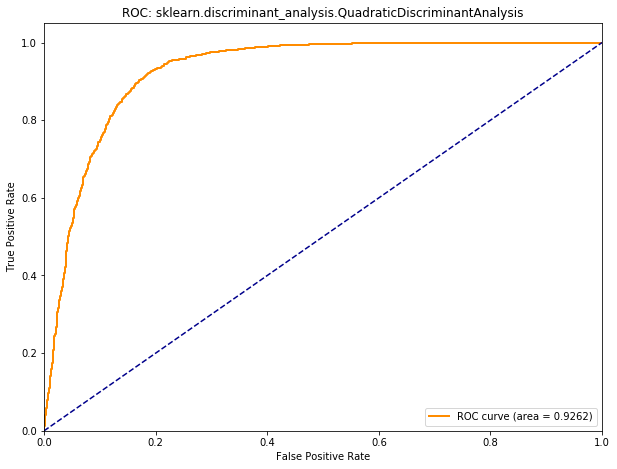


############################################################
sklearn.neural_network.multilayer_perceptron.MLPClassifier
############################################################
In-Sample Accuracy: 0.8582
CV Threshold 0.4964 Accuracy 0.8648 F1 0.8680
Out-Of-Sample Accuracy: 0.8578
Confusion Matrix:
[[1653  347]
 [ 222 1778]]
(True negative 1653 True positive 1778 False positive 222 False negative 347)
AUC: 0.9223


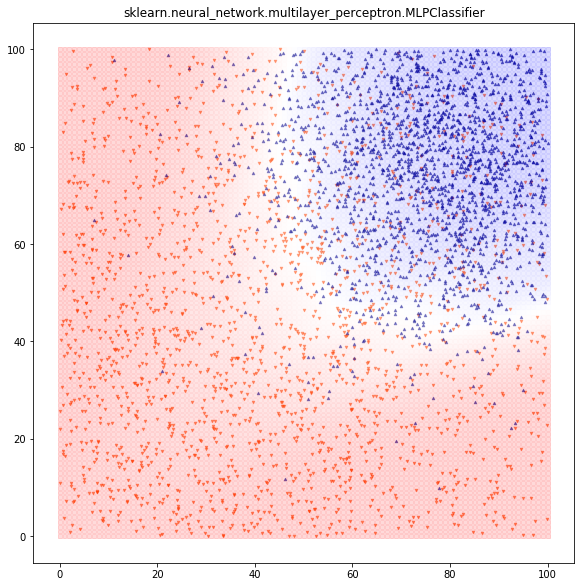

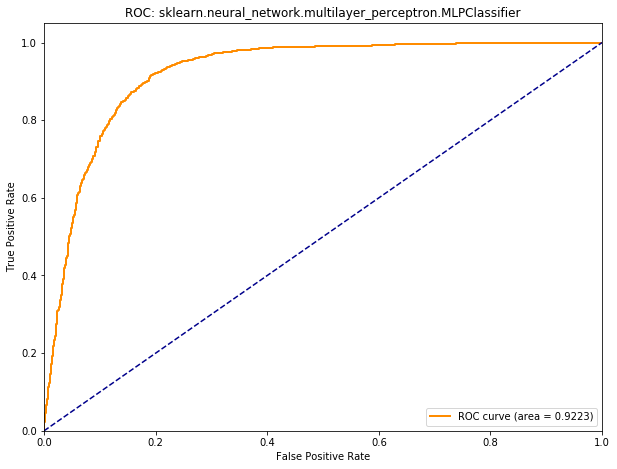


############################################################
sklearn.ensemble.gradient_boosting.GradientBoostingClassifier
############################################################
In-Sample Accuracy: 0.8732
CV Threshold 0.4098 Accuracy 0.8678 F1 0.8753
Out-Of-Sample Accuracy: 0.8645
Confusion Matrix:
[[1583  417]
 [ 125 1875]]
(True negative 1583 True positive 1875 False positive 125 False negative 417)
AUC: 0.9211


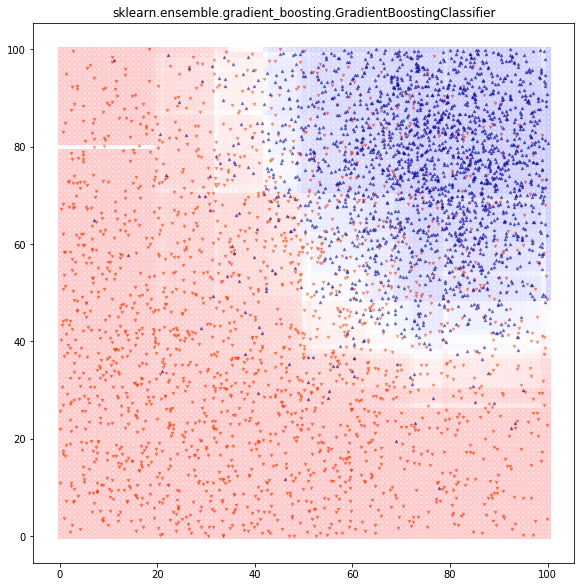

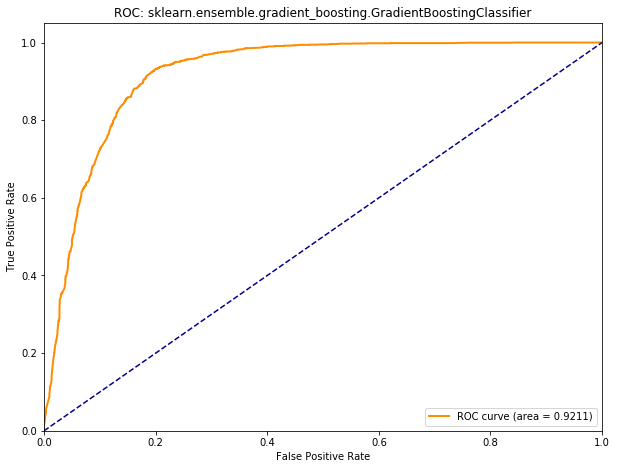


############################################################
myXGBClassifier.<locals>.create_model
############################################################


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



In-Sample Accuracy: 0.8672
CV Threshold 0.5644 Accuracy 0.8682 F1 0.8704
Out-Of-Sample Accuracy: 0.8622
Confusion Matrix:
[[1681  319]
 [ 232 1768]]
(True negative 1681 True positive 1768 False positive 232 False negative 319)
AUC: 0.9234


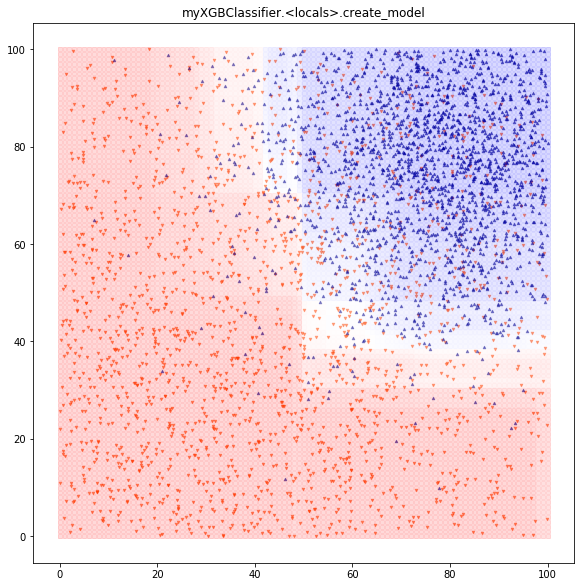

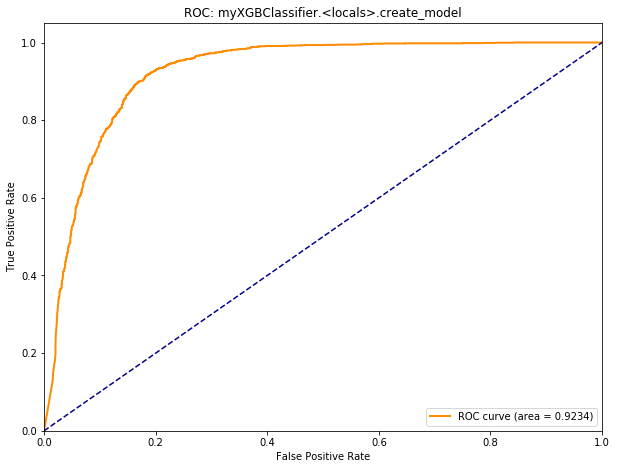


############################################################
myCatBoostClassifier.<locals>.create_model
############################################################

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.
In-Sample Accuracy: 0.8720
CV Threshold 0.4896 Accuracy 0.8680 F1 0.8745
Out-Of-Sample Accuracy: 0.8638
Confusion Matrix:
[[1603  397]
 [ 148 1852]]
(True negative 1603 True positive 1852 False positive 148 False negative 

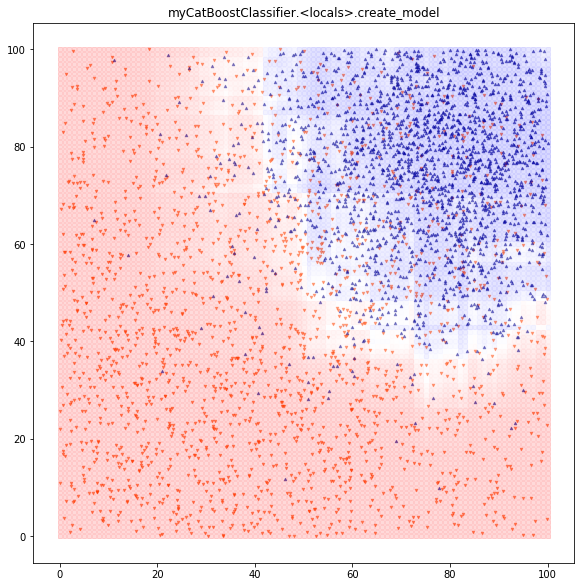

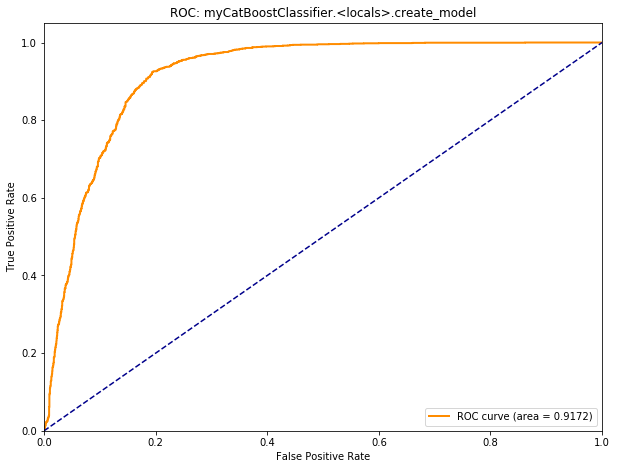


############################################################
myLGBMClassifier.<locals>.create_model
############################################################
In-Sample Accuracy: 0.8862


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



CV Threshold 0.4924 Accuracy 0.8625 F1 0.8690
Out-Of-Sample Accuracy: 0.8582
Confusion Matrix:
[[1604  396]
 [ 171 1829]]
(True negative 1604 True positive 1829 False positive 171 False negative 396)
AUC: 0.9118


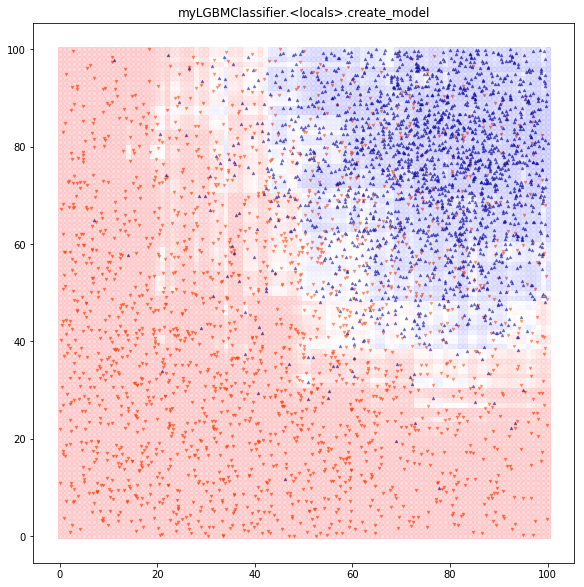

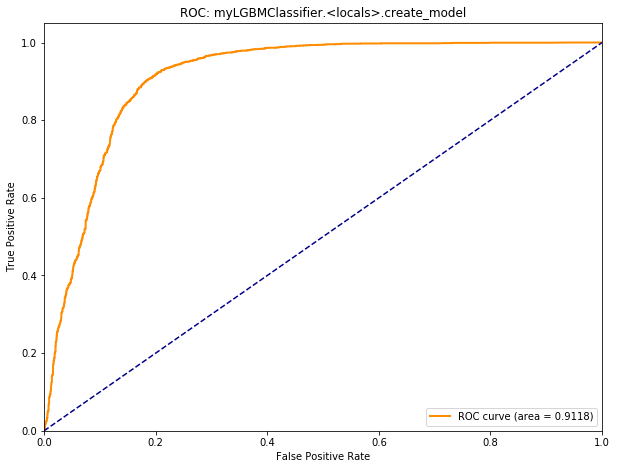


############################################################
sklearn.ensemble.weight_boosting.AdaBoostClassifier
############################################################
In-Sample Accuracy: 0.8655
CV Threshold 0.5001 Accuracy 0.8635 F1 0.8684
Out-Of-Sample Accuracy: 0.8565
Confusion Matrix:
[[1609  391]
 [ 183 1817]]
(True negative 1609 True positive 1817 False positive 183 False negative 391)
AUC: 0.9174


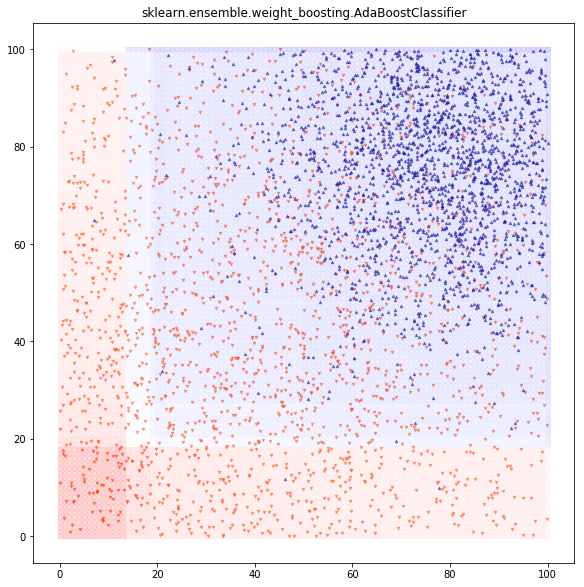

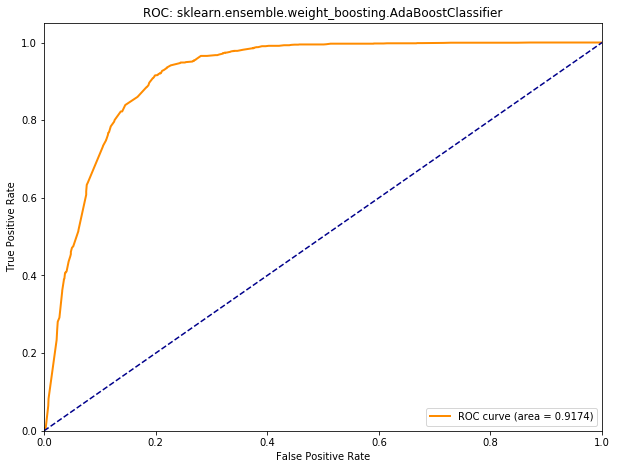


############################################################
sklearn.ensemble.bagging.BaggingClassifier
############################################################
In-Sample Accuracy: 0.9852
CV Threshold 0.3000 Accuracy 0.8482 F1 0.8575
Out-Of-Sample Accuracy: 0.8343
Confusion Matrix:
[[1513  487]
 [ 176 1824]]
(True negative 1513 True positive 1824 False positive 176 False negative 487)
AUC: 0.8921


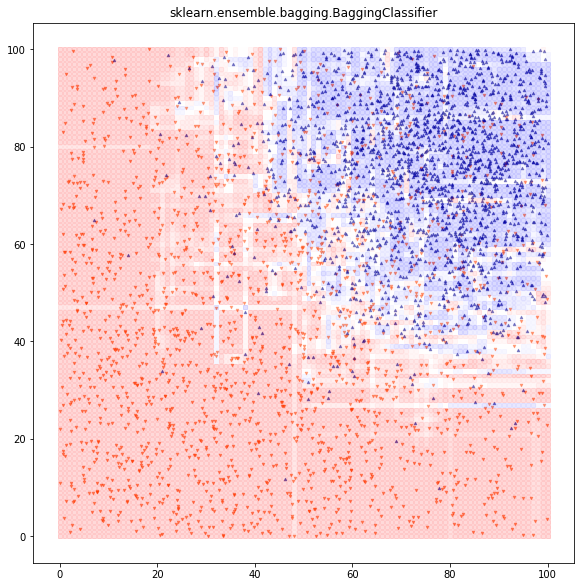

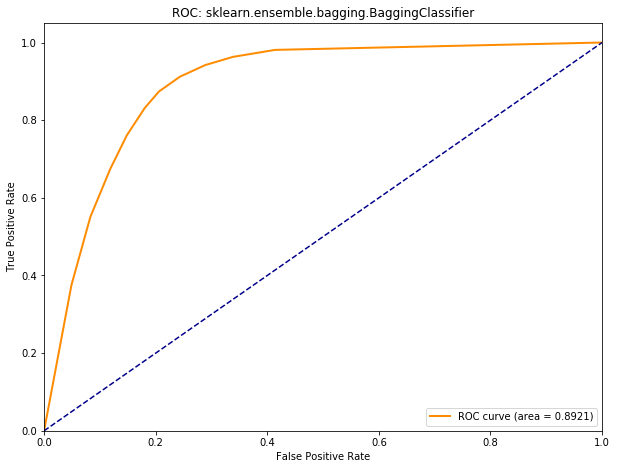


############################################################
sklearn.tree.tree.DecisionTreeClassifier
############################################################
In-Sample Accuracy: 1.0000
CV Threshold 0.0000 Accuracy 0.7967 F1 0.7952
Out-Of-Sample Accuracy: 0.7865
Confusion Matrix:
[[1575  425]
 [ 429 1571]]
(True negative 1575 True positive 1571 False positive 429 False negative 425)
AUC: 0.7865


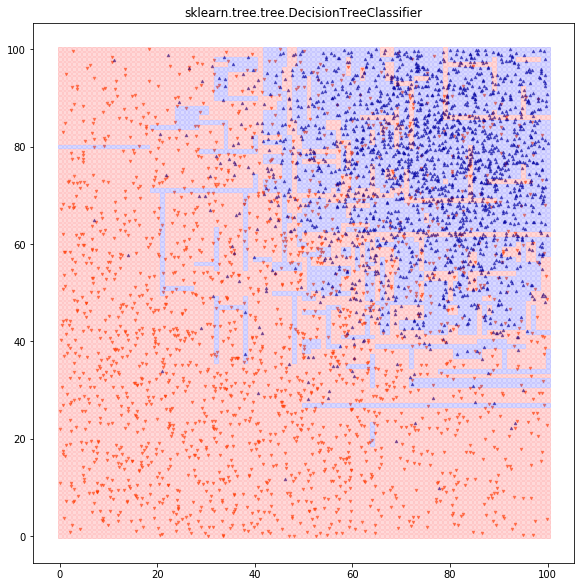

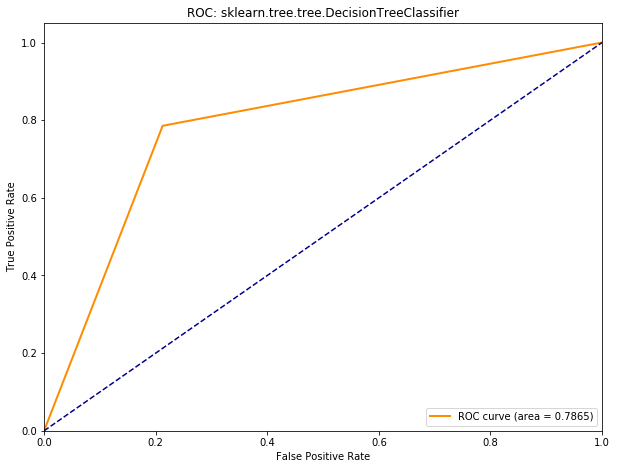


############################################################
sklearn.ensemble.forest.RandomForestClassifier
############################################################
In-Sample Accuracy: 0.9845
CV Threshold 0.3000 Accuracy 0.8498 F1 0.8595
Out-Of-Sample Accuracy: 0.8367
Confusion Matrix:
[[1513  487]
 [ 166 1834]]
(True negative 1513 True positive 1834 False positive 166 False negative 487)
AUC: 0.8933


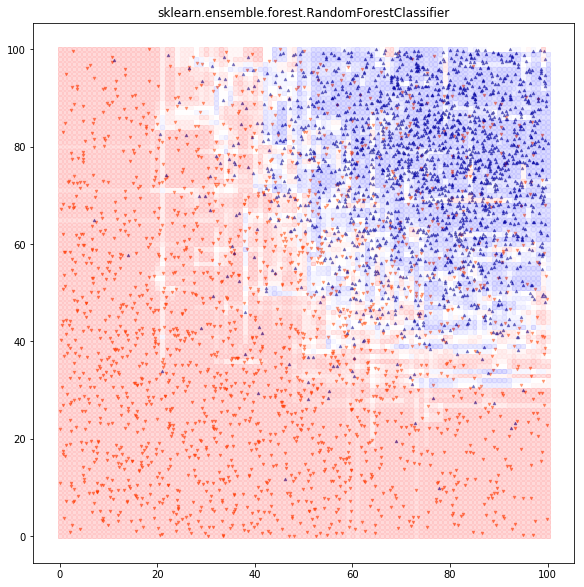

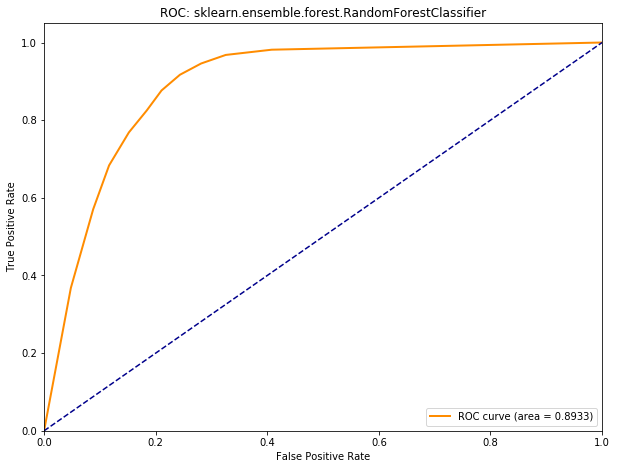


############################################################
sklearn.tree.tree.ExtraTreeClassifier
############################################################
In-Sample Accuracy: 1.0000
CV Threshold 0.0000 Accuracy 0.8100 F1 0.8118
Out-Of-Sample Accuracy: 0.8010
Confusion Matrix:
[[1606  394]
 [ 402 1598]]
(True negative 1606 True positive 1598 False positive 402 False negative 394)
AUC: 0.8010


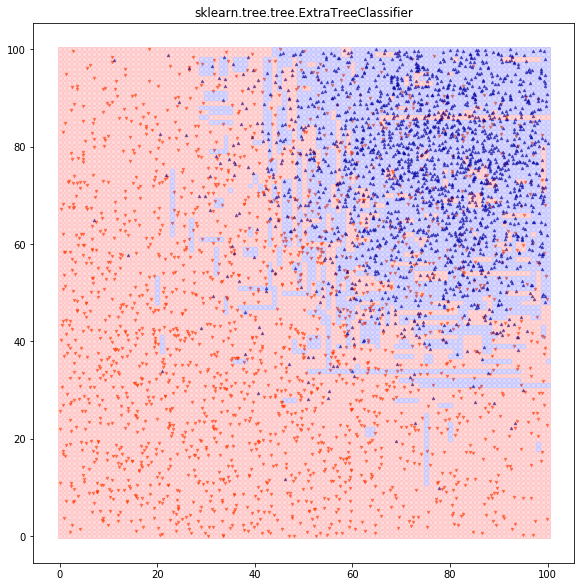

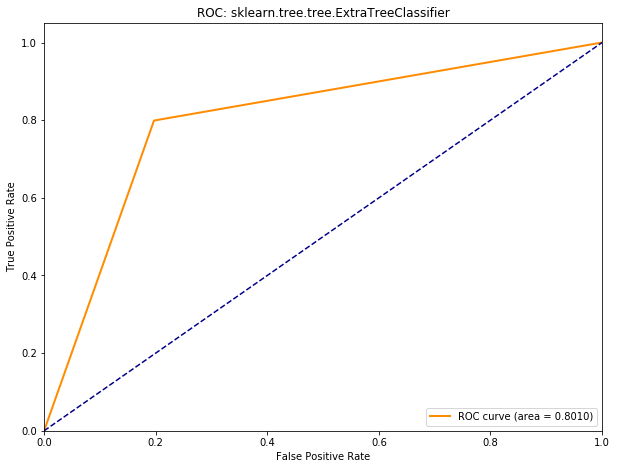


############################################################
sklearn.ensemble.forest.ExtraTreesClassifier
############################################################
In-Sample Accuracy: 1.0000
CV Threshold 0.3000 Accuracy 0.8370 F1 0.8481
Out-Of-Sample Accuracy: 0.8363
Confusion Matrix:
[[1513  487]
 [ 168 1832]]
(True negative 1513 True positive 1832 False positive 168 False negative 487)
AUC: 0.8887


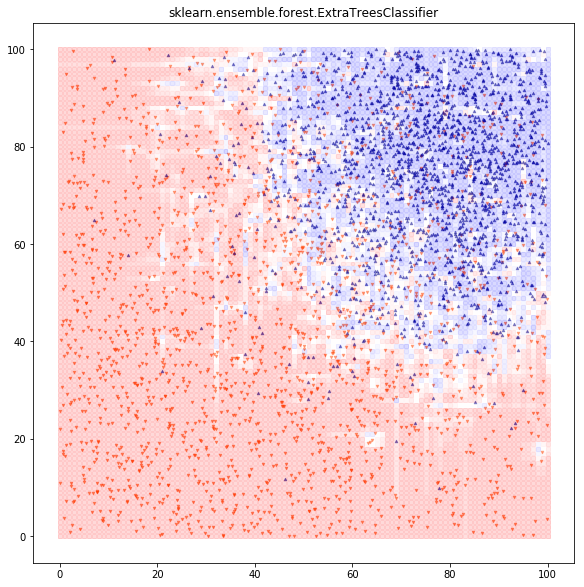

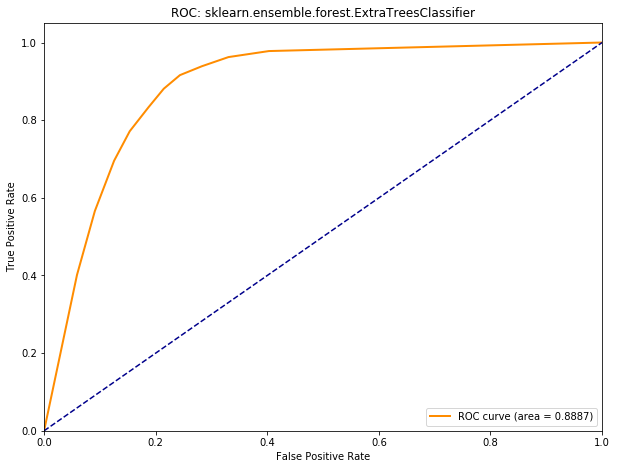


############################################################
sklearn.naive_bayes.BernoulliNB
############################################################
In-Sample Accuracy: 0.5000
CV Threshold 1.5000 Accuracy 0.5000 F1 0.0000
Out-Of-Sample Accuracy: 0.5000
Confusion Matrix:
[[2000    0]
 [2000    0]]
(True negative 2000 True positive 0 False positive 2000 False negative 0)
AUC: 0.5000


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.



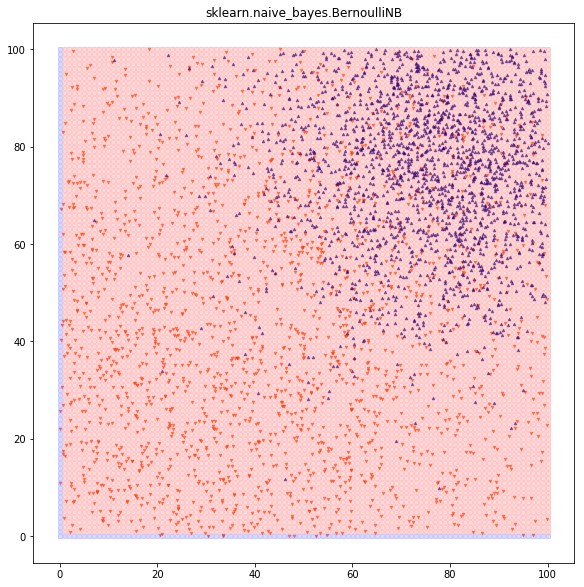

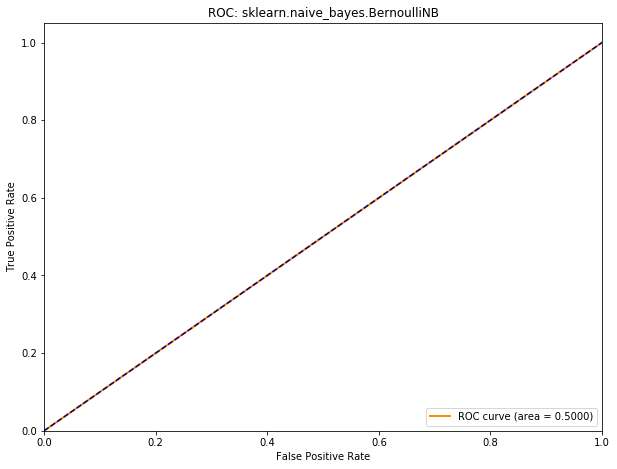


############################################################
sklearn.calibration.CalibratedClassifierCV
############################################################
In-Sample Accuracy: 0.8363
CV Threshold 0.4279 Accuracy 0.8535 F1 0.8621
Out-Of-Sample Accuracy: 0.8400
Confusion Matrix:
[[1536  464]
 [ 176 1824]]
(True negative 1536 True positive 1824 False positive 176 False negative 464)
AUC: 0.9100


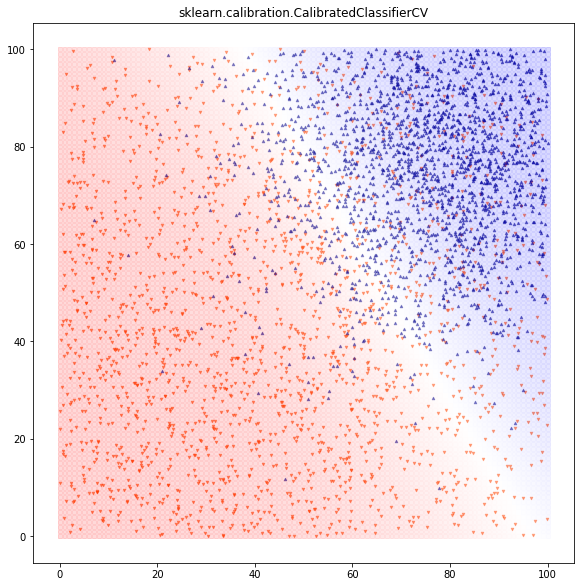

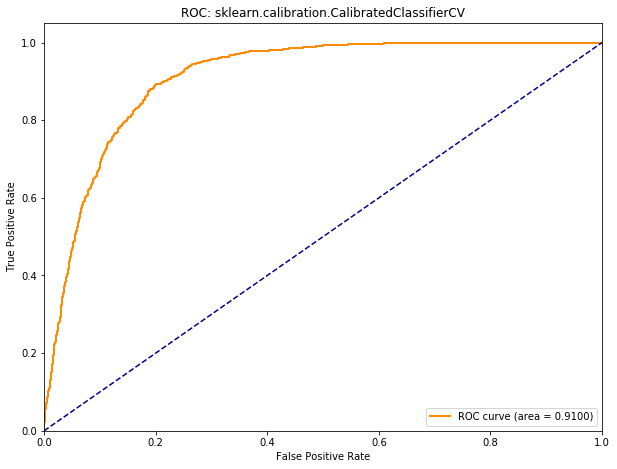


############################################################
sklearn.naive_bayes.GaussianNB
############################################################
In-Sample Accuracy: 0.8595
CV Threshold 0.4976 Accuracy 0.8720 F1 0.8759
Out-Of-Sample Accuracy: 0.8650
Confusion Matrix:
[[1660  340]
 [ 200 1800]]
(True negative 1660 True positive 1800 False positive 200 False negative 340)
AUC: 0.9263


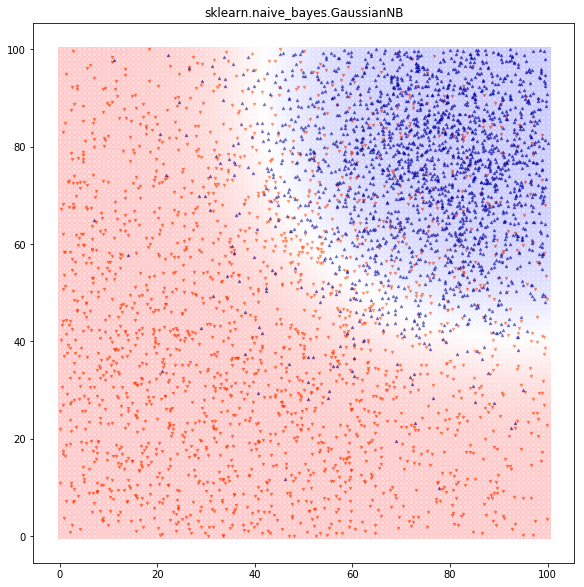

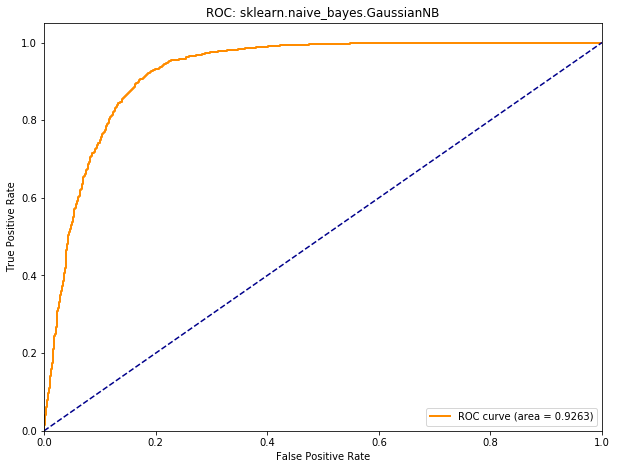


############################################################
sklearn.gaussian_process.gpc.GaussianProcessClassifier
############################################################
In-Sample Accuracy: 0.9225
CV Threshold 0.5082 Accuracy 0.8465 F1 0.8510
Out-Of-Sample Accuracy: 0.8345
Confusion Matrix:
[[1606  394]
 [ 268 1732]]
(True negative 1606 True positive 1732 False positive 268 False negative 394)
AUC: 0.8887


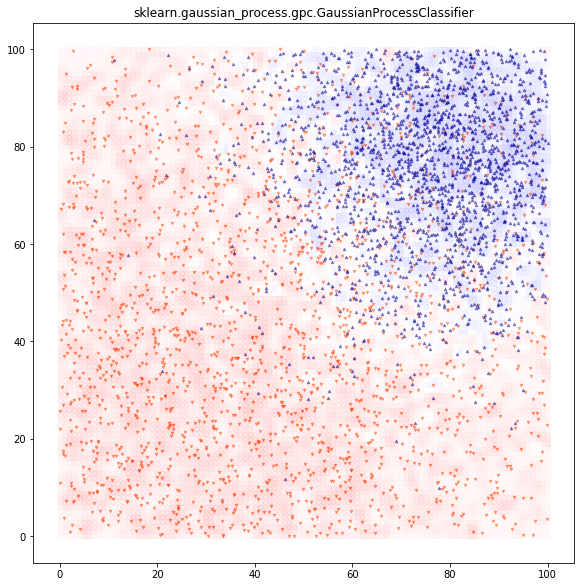

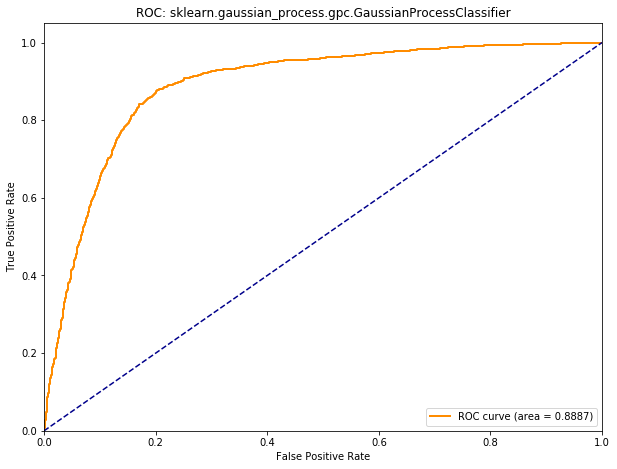


############################################################
sklearn.neighbors.classification.KNeighborsClassifier
############################################################
In-Sample Accuracy: 0.8780
CV Threshold 0.4000 Accuracy 0.8508 F1 0.8551
Out-Of-Sample Accuracy: 0.8470
Confusion Matrix:
[[1623  377]
 [ 235 1765]]
(True negative 1623 True positive 1765 False positive 235 False negative 377)
AUC: 0.8985


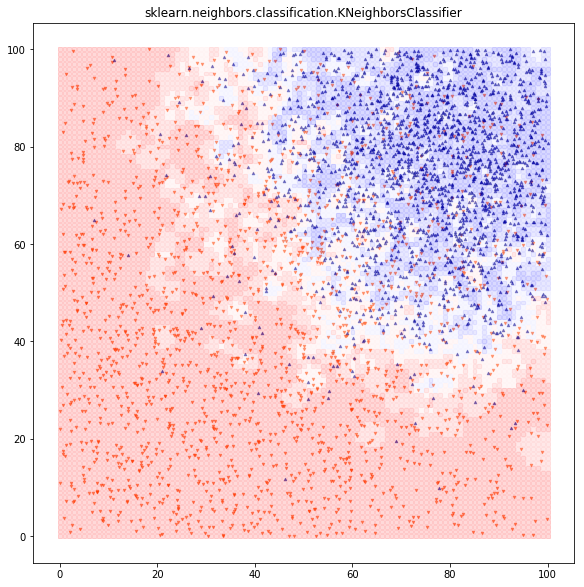

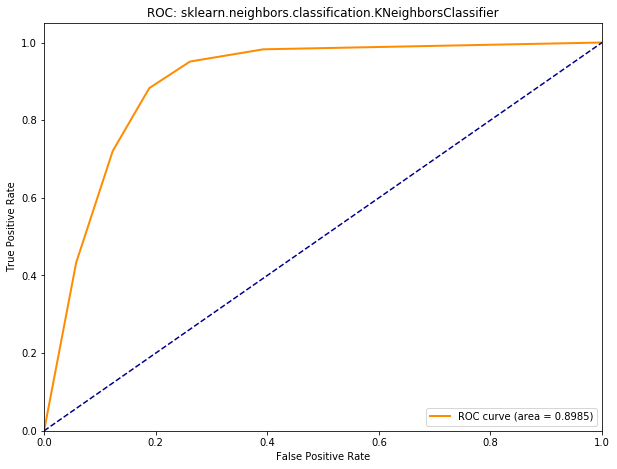


############################################################
sklearn.semi_supervised.label_propagation.LabelPropagation
############################################################
In-Sample Accuracy: 0.9998
CV Threshold 0.0000 Accuracy 0.8260 F1 0.8427
Out-Of-Sample Accuracy: 0.8247
Confusion Matrix:
[[1425  575]
 [ 126 1874]]
(True negative 1425 True positive 1874 False positive 126 False negative 575)
AUC: 0.8698


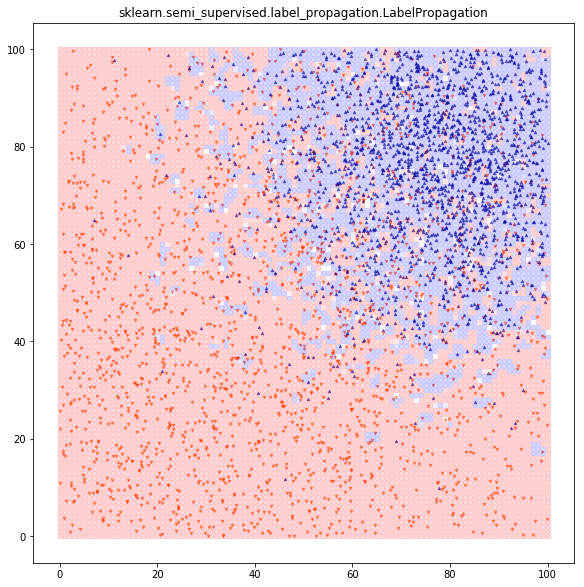

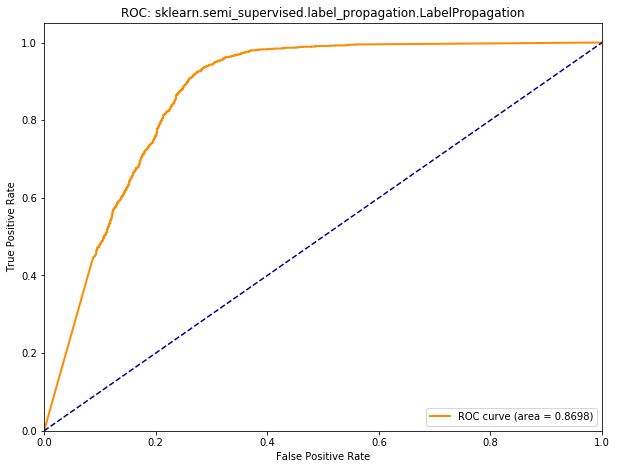


############################################################
sklearn.semi_supervised.label_propagation.LabelSpreading
############################################################
In-Sample Accuracy: 0.9992
CV Threshold 0.0000 Accuracy 0.8263 F1 0.8443
Out-Of-Sample Accuracy: 0.8193
Confusion Matrix:
[[1393  607]
 [ 116 1884]]
(True negative 1393 True positive 1884 False positive 116 False negative 607)
AUC: 0.8744


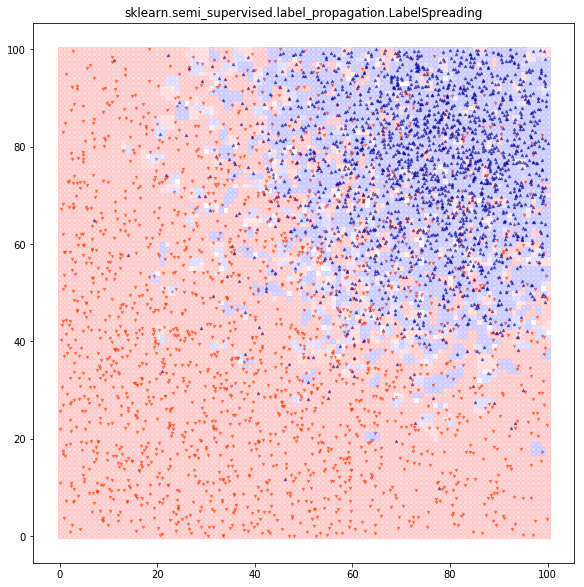

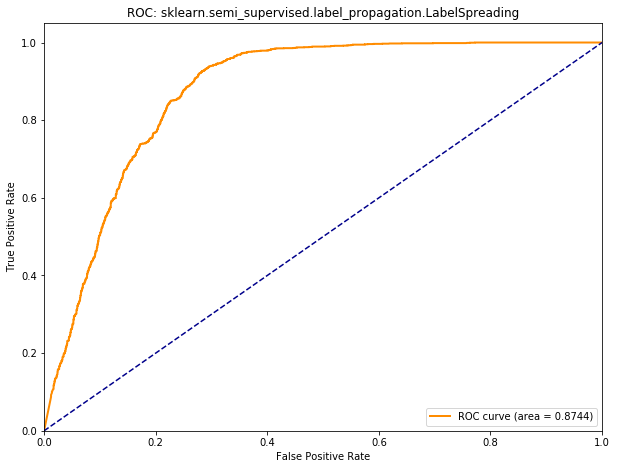


############################################################
sklearn.naive_bayes.MultinomialNB
############################################################
In-Sample Accuracy: 0.5198
CV Threshold 0.4075 Accuracy 0.5717 F1 0.6733
Out-Of-Sample Accuracy: 0.5670
Confusion Matrix:
[[ 499 1501]
 [ 231 1769]]
(True negative 499 True positive 1769 False positive 231 False negative 1501)
AUC: 0.4997


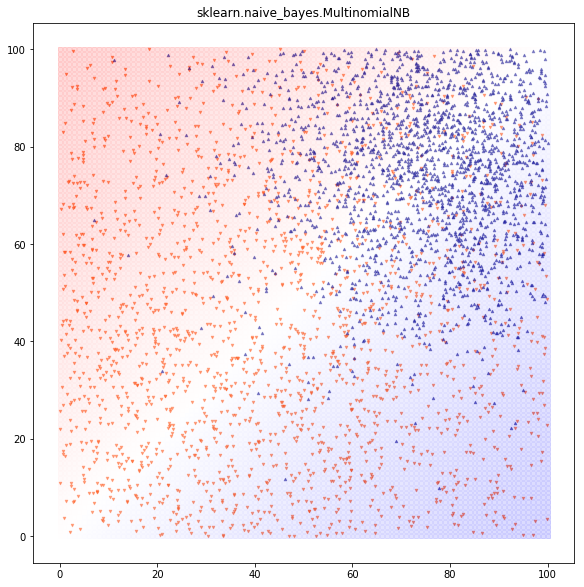

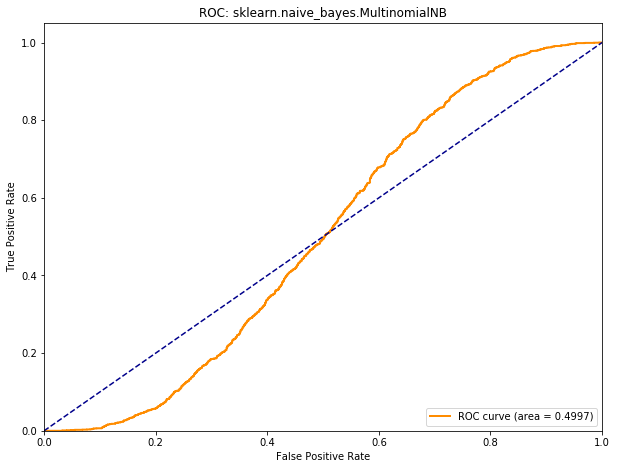


############################################################
myNuSVC
############################################################
In-Sample Accuracy: 0.9187
CV Threshold 0.3793 Accuracy 0.8478 F1 0.8525
Out-Of-Sample Accuracy: 0.8357
Confusion Matrix:
[[1609  391]
 [ 266 1734]]
(True negative 1609 True positive 1734 False positive 266 False negative 391)
AUC: 0.8770


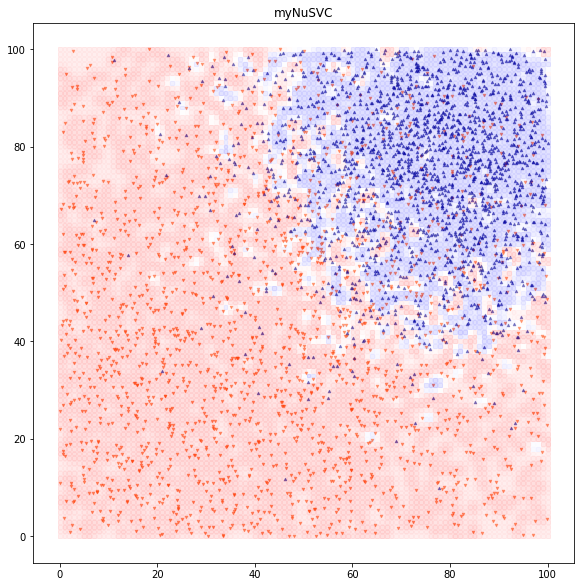

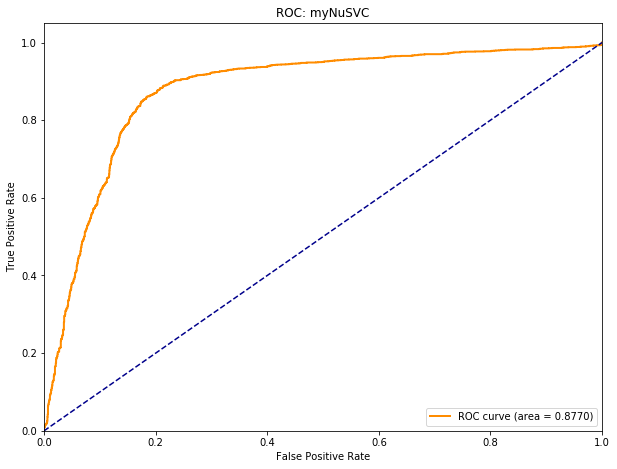


############################################################
mySGDClassifierLog
############################################################
In-Sample Accuracy: 0.8458
CV Threshold 1.0000 Accuracy 0.8600 F1 0.8675
Out-Of-Sample Accuracy: 0.8550
Confusion Matrix:
[[1586  414]
 [ 166 1834]]
(True negative 1586 True positive 1834 False positive 166 False negative 414)
AUC: 0.8771


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning:

overflow encountered in exp



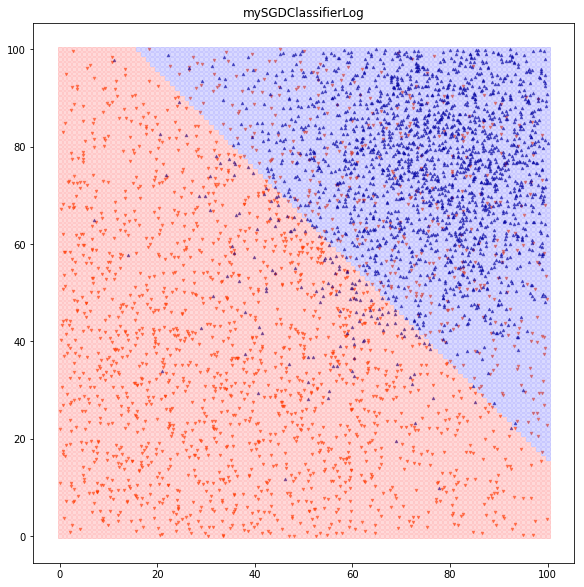

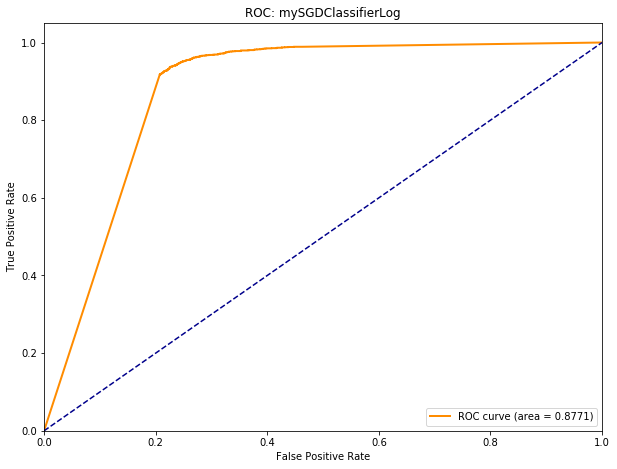


############################################################
mySVC
############################################################
In-Sample Accuracy: 0.9200
CV Threshold 0.3610 Accuracy 0.8465 F1 0.8520
Out-Of-Sample Accuracy: 0.8345
Confusion Matrix:
[[1596  404]
 [ 258 1742]]
(True negative 1596 True positive 1742 False positive 258 False negative 404)
AUC: 0.8755


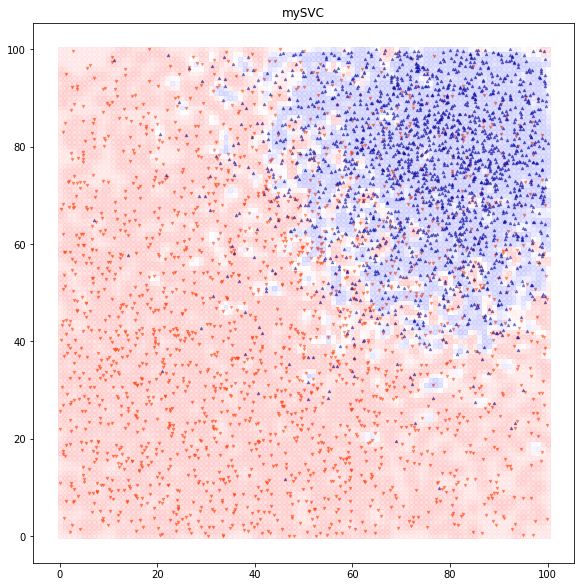

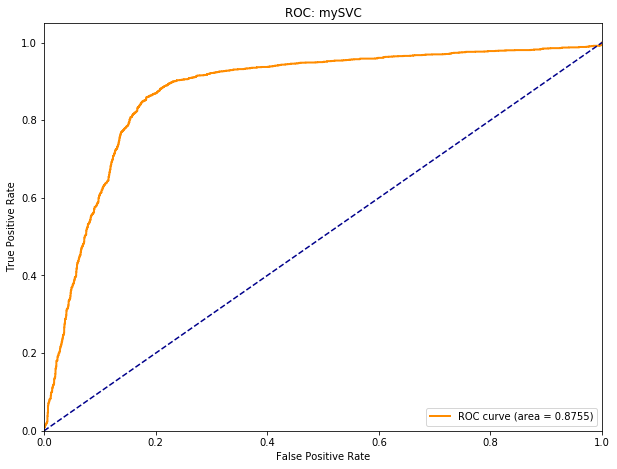


############################################################
kerasClassifierFactory.<locals>.create_fn
############################################################
layer 1 size 16, reg_penalty 0.01000000
layer 2 size 16, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
Dense01 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 17        
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________
None
In-Sample Accuracy: 0.8610

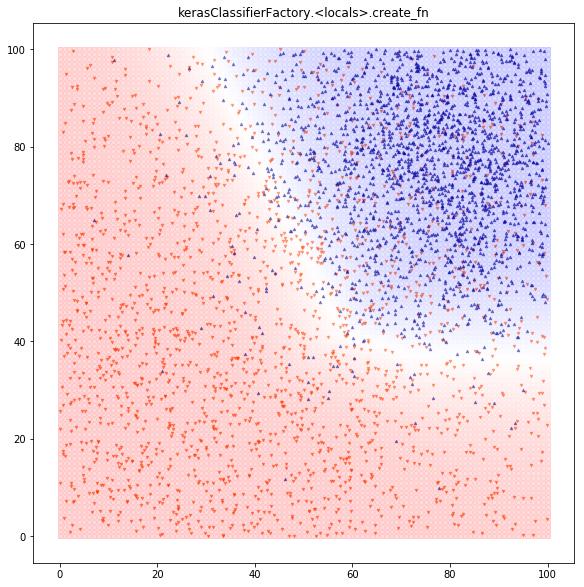

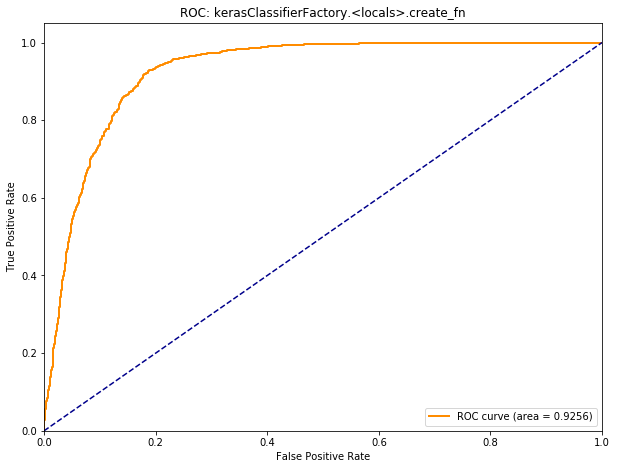

In [16]:

estimators = [sklearn.linear_model.logistic.LogisticRegression,
              sklearn.linear_model.logistic.LogisticRegressionCV,
              sklearn.discriminant_analysis.LinearDiscriminantAnalysis,
              statsmodels_wrapper(statsmodels.discrete.discrete_model.Logit),
              statsmodels_wrapper(statsmodels.discrete.discrete_model.Probit),
              sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis,
              sklearn.neural_network.multilayer_perceptron.MLPClassifier,
              sklearn.ensemble.gradient_boosting.GradientBoostingClassifier,
              myXGBClassifier(),
              myCatBoostClassifier(),
              myLGBMClassifier(),
              sklearn.ensemble.weight_boosting.AdaBoostClassifier,
              sklearn.ensemble.bagging.BaggingClassifier,
              sklearn.tree.tree.DecisionTreeClassifier,
              sklearn.ensemble.forest.RandomForestClassifier,
              sklearn.tree.tree.ExtraTreeClassifier,
              sklearn.ensemble.forest.ExtraTreesClassifier,
              sklearn.naive_bayes.BernoulliNB,
              sklearn.calibration.CalibratedClassifierCV,
              sklearn.naive_bayes.GaussianNB,
              sklearn.gaussian_process.gpc.GaussianProcessClassifier,
              sklearn.neighbors.classification.KNeighborsClassifier,
              sklearn.semi_supervised.label_propagation.LabelPropagation,
              sklearn.semi_supervised.label_propagation.LabelSpreading,
              sklearn.naive_bayes.MultinomialNB,
              myNuSVC,
              mySGDClassifierLog,
              mySVC,
              kerasClassifierFactory(),
             ]

est_names=[]
for estimator in estimators:
    # fit 
    estname = str(estimator)[10:-19] if str(type(estimator))=="<class 'function'>" else str(estimator)[8:-2]
    print('############################################################')
    print(estname)  
    print('############################################################')
    est_names.append(estname)
    est = estimator()
    est.fit(X, y)
    y_pred = est.predict(X)
    print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
    # select threshold using CV data to maximize accuracy
    y_cv_pred_prob = est.predict_proba(X_cv)[:,1]
    thresh = select_threshold(y_cv, y_cv_pred_prob, sklearn.metrics.accuracy_score)
    y_cv_pred = y_cv_pred_prob > thresh
    acc = sklearn.metrics.accuracy_score(y_cv, y_cv_pred)
    f1_score = sklearn.metrics.f1_score(y_cv, y_cv_pred)
    print("CV Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

    # evaluate estimator using test data
    y_test_pred_prob = est.predict_proba(X_test)[:,1]
    y_test_pred = y_test_pred_prob > thresh
    print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
    print("Confusion Matrix:")
    conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
    print (conf_mat)
    print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

    z = est.predict_proba(X_pred)
    if len(z.shape) == 1:
        z = z.reshape(z.shape[0], 1)

    Z = np.hstack([X_pred, z])
    class_chart_matplotlib(class1_test, class2_test, Z, estname, bgsize=15)   
    try: # sometimes got nans
        roc_chart(est, X_test, y_test, "ROC: %s" % estname)
    except:
        pass
    print()


############################################################
LogisticRegression
In-Sample Accuracy: 0.8478
CV Threshold 0.4390 Accuracy 0.8608 F1 0.8679
Out-Of-Sample Accuracy: 0.8528
Confusion Matrix:
[[1589  411]
 [ 178 1822]]
(True negative 1589 True positive 1822 False positive 178 False negative 411)
############################################################

############################################################
LogisticRegressionCV
In-Sample Accuracy: 0.8472
CV Threshold 0.4369 Accuracy 0.8608 F1 0.8679
Out-Of-Sample Accuracy: 0.8525
Confusion Matrix:
[[1588  412]
 [ 178 1822]]
(True negative 1588 True positive 1822 False positive 178 False negative 412)
############################################################

############################################################
LinearDiscriminantAnalysis
In-Sample Accuracy: 0.8475
CV Threshold 0.4978 Accuracy 0.8612 F1 0.8686
Out-Of-Sample Accuracy: 0.8552
Confusion Matrix:
[[1590  410]
 [ 169 1831]]
(True negative 1590 Tru

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning:

overflow encountered in exp



############################################################

############################################################
QuadraticDiscriminantAnalysis
In-Sample Accuracy: 0.8588
CV Threshold 0.4965 Accuracy 0.8720 F1 0.8760
Out-Of-Sample Accuracy: 0.8652
Confusion Matrix:
[[1659  341]
 [ 198 1802]]
(True negative 1659 True positive 1802 False positive 198 False negative 341)
############################################################

############################################################
MLPClassifier
In-Sample Accuracy: 0.8435
CV Threshold 0.6691 Accuracy 0.8670 F1 0.8729
Out-Of-Sample Accuracy: 0.8605
Confusion Matrix:
[[1617  383]
 [ 175 1825]]
(True negative 1617 True positive 1825 False positive 175 False negative 383)
############################################################

############################################################
GaussianNB
In-Sample Accuracy: 0.8595
CV Threshold 0.4976 Accuracy 0.8720 F1 0.8759
Out-Of-Sample Accuracy: 0.8650
Confusion Matrix:


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



In-Sample Accuracy: 0.8672
CV Threshold 0.5644 Accuracy 0.8682 F1 0.8704
Out-Of-Sample Accuracy: 0.8622
Confusion Matrix:
[[1681  319]
 [ 232 1768]]
(True negative 1681 True positive 1768 False positive 232 False negative 319)
############################################################

############################################################
CatBoostClassifier

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time -2.21e+06 sec ignored in overall statistics.

Iteration with suspicious time 2.21e+06 sec ignored in overall statistics.

Iteration with sus

/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



CV Threshold 0.4924 Accuracy 0.8625 F1 0.8690
Out-Of-Sample Accuracy: 0.8582
Confusion Matrix:
[[1604  396]
 [ 171 1829]]
(True negative 1604 True positive 1829 False positive 171 False negative 396)
############################################################

############################################################
AdaBoostClassifier
In-Sample Accuracy: 0.8655
CV Threshold 0.5001 Accuracy 0.8635 F1 0.8684
Out-Of-Sample Accuracy: 0.8565
Confusion Matrix:
[[1609  391]
 [ 183 1817]]
(True negative 1609 True positive 1817 False positive 183 False negative 391)
############################################################

############################################################
BernoulliNB
In-Sample Accuracy: 0.5000
CV Threshold 1.5000 Accuracy 0.5000 F1 0.0000
Out-Of-Sample Accuracy: 0.5000
Confusion Matrix:


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.



[[2000    0]
 [2000    0]]
(True negative 2000 True positive 0 False positive 2000 False negative 0)
############################################################

############################################################
GaussianProcessClassifier
In-Sample Accuracy: 0.9225
CV Threshold 0.5082 Accuracy 0.8465 F1 0.8510
Out-Of-Sample Accuracy: 0.8345
Confusion Matrix:
[[1606  394]
 [ 268 1732]]
(True negative 1606 True positive 1732 False positive 268 False negative 394)
############################################################

############################################################
KNeighborsClassifier
In-Sample Accuracy: 0.8780
CV Threshold 0.4000 Accuracy 0.8508 F1 0.8551
Out-Of-Sample Accuracy: 0.8470
Confusion Matrix:
[[1623  377]
 [ 235 1765]]
(True negative 1623 True positive 1765 False positive 235 False negative 377)
############################################################

############################################################
LabelPropagation
In-Sample Ac

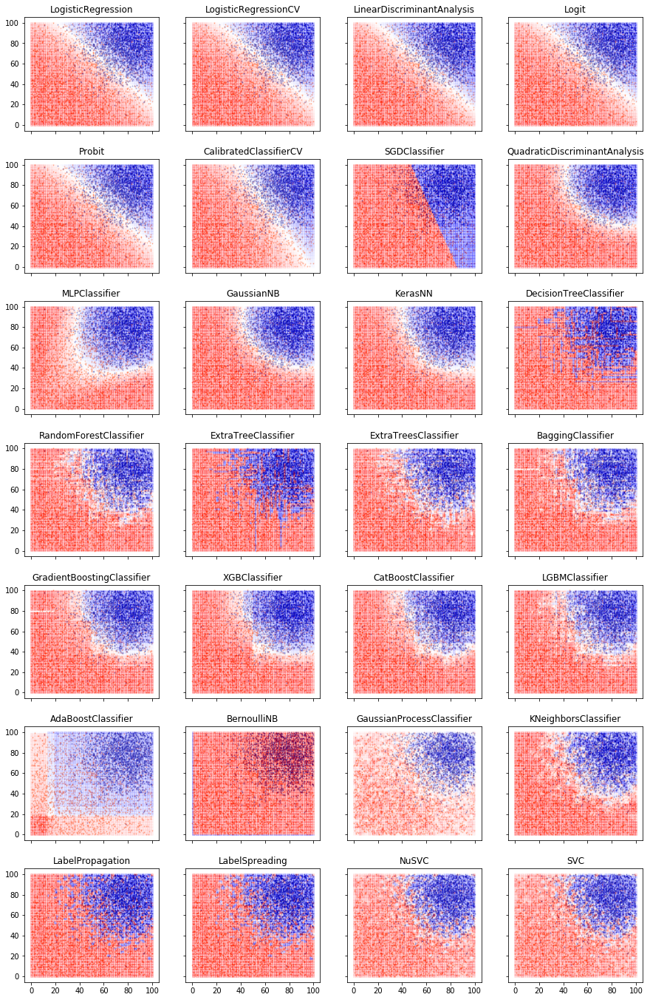

In [21]:
# same in grid

estimator_list = [('LogisticRegression', sklearn.linear_model.logistic.LogisticRegression),
                  ('LogisticRegressionCV', sklearn.linear_model.logistic.LogisticRegressionCV),
                  ('LinearDiscriminantAnalysis', sklearn.discriminant_analysis.LinearDiscriminantAnalysis),
                  ('Logit', statsmodels_wrapper(statsmodels.discrete.discrete_model.Logit)),
                  ('Probit', statsmodels_wrapper(statsmodels.discrete.discrete_model.Probit)),
                  ('CalibratedClassifierCV', sklearn.calibration.CalibratedClassifierCV),
                  ('SGDClassifier', mySGDClassifierLog),
                  ('QuadraticDiscriminantAnalysis', sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis),
                  ('MLPClassifier', sklearn.neural_network.multilayer_perceptron.MLPClassifier),
                  ('GaussianNB', sklearn.naive_bayes.GaussianNB),
                  ('KerasNN', kerasClassifierFactory()),
                  ('DecisionTreeClassifier', sklearn.tree.tree.DecisionTreeClassifier),
                  ('RandomForestClassifier', sklearn.ensemble.forest.RandomForestClassifier),
                  ('ExtraTreeClassifier', sklearn.tree.tree.ExtraTreeClassifier),
                  ('ExtraTreesClassifier', sklearn.ensemble.forest.ExtraTreesClassifier),
                  ('BaggingClassifier', sklearn.ensemble.bagging.BaggingClassifier),
                  ('GradientBoostingClassifier', sklearn.ensemble.gradient_boosting.GradientBoostingClassifier),
                  ('XGBClassifier', myXGBClassifier()),
                  ('CatBoostClassifier', myCatBoostClassifier()),
                  ('LGBMClassifier', myLGBMClassifier()),
                  ('AdaBoostClassifier', sklearn.ensemble.weight_boosting.AdaBoostClassifier),
                  ('BernoulliNB', sklearn.naive_bayes.BernoulliNB),
                  ('GaussianProcessClassifier', sklearn.gaussian_process.gpc.GaussianProcessClassifier),
                  ('KNeighborsClassifier', sklearn.neighbors.classification.KNeighborsClassifier),
                  ('LabelPropagation', sklearn.semi_supervised.label_propagation.LabelPropagation),
                  ('LabelSpreading', sklearn.semi_supervised.label_propagation.LabelSpreading),
                  #              ('MultinomialNB', sklearn.naive_bayes.MultinomialNB),
                  ('NuSVC', myNuSVC),
                  ('SVC', mySVC),
                 ]

figrows = 7
figcols = 4

f, axarr = plt.subplots(figrows, figcols, figsize=(15, 24), sharex=True, sharey=True)
f.subplots_adjust(hspace=0.25)
f.subplots_adjust(wspace=0.2)

for i, (estname, estimator) in enumerate(estimator_list):
    print('############################################################')
    print(estname)
    # fit 
    est = estimator()
    est.fit(X, y)
    y_pred = est.predict(X)
    print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))
    
    # select threshold using CV data to maximize accuracy
    y_cv_pred_prob = est.predict_proba(X_cv)[:,1]
    thresh = select_threshold(y_cv, y_cv_pred_prob, sklearn.metrics.accuracy_score)
    y_cv_pred = y_cv_pred_prob > thresh
    acc = sklearn.metrics.accuracy_score(y_cv, y_cv_pred)
    f1_score = sklearn.metrics.f1_score(y_cv, y_cv_pred)
    print("CV Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

    # evaluate estimator using test data
    y_test_pred_prob = est.predict_proba(X_test)[:,1]
    y_test_pred = y_test_pred_prob > thresh
    print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
    print("Confusion Matrix:")
    conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
    print (conf_mat)
    print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

    z = est.predict_proba(X_pred)
    if len(z.shape) == 1:
        z = z.reshape(z.shape[0], 1)

    Z = np.hstack([X_pred, z])
    
    sub_row = i // figcols
    sub_col = i % figcols
    widget =  axarr[sub_row, sub_col]
    class_chart_matplotlib(class1_test, class2_test, Z, estname, widget=widget, markersize=1, bgsize=2)   
    print('############################################################')
    print()
    
plt.savefig('grid.png') 


layer 1 size 16, reg_penalty 0.01000000
layer 2 size 16, reg_penalty 0.01000000
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 2)                 0         
_________________________________________________________________
Dense00 (Dense)              (None, 16)                48        
_________________________________________________________________
Dense01 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 17        
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________
None


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



In-Sample Accuracy: 0.8608


/home/ubuntu/anaconda3/envs/tensorflow5/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



Out-Of-Sample Accuracy: 0.8648
Confusion Matrix:
[[1652  348]
 [ 193 1807]]
(True negative 1652 True positive 1807 False positive 193 False negative 348)
AUC: 0.9263


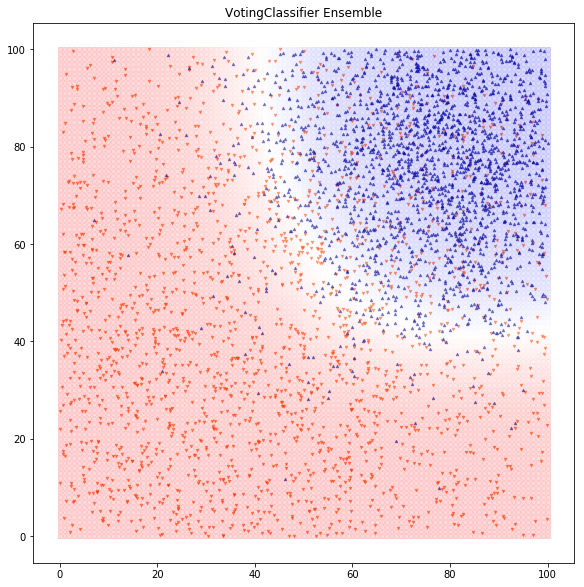

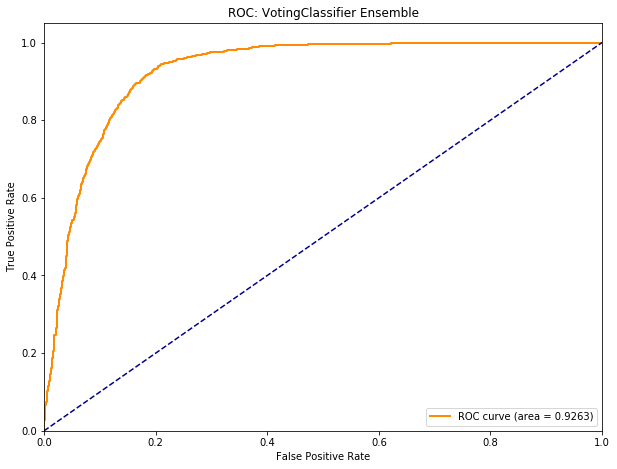

In [20]:
# ensemble of best classifiers
# selected using which metrics? 
# CV accuracy.
# The answer is never a test metric.
# unless the question is, 'what metric do you never use to make a decision about your model?'

ensemble_estimators = [
    sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis(),
    sklearn.neural_network.multilayer_perceptron.MLPClassifier(),
#    sklearn.ensemble.gradient_boosting.GradientBoostingClassifier(),
#    sklearn.ensemble.weight_boosting.AdaBoostClassifier(),
    xgboost.sklearn.XGBClassifier(n_estimators=1000, max_depth=4, subsample=0.7, learning_rate=0.001, nthreads=-1),
#    catboost.CatBoostClassifier(loss_function='MultiClass', task_type='CPU', logging_level='Silent'),    
    sklearn.naive_bayes.GaussianNB(),
    kerasClassifierFactory()(),
]


estimator_names = [
    'QuadraticDiscriminantAnalysis',
    'MLPClassifier',
#    'GradientBoostingClassifier',
#    'AdaBoostClassifier',
    'XGBoost Classifier',
#    'CatBoost Classifier',
    'GaussianNB',
    'KerasNN',
]

vc = VotingClassifier(estimators=list(zip(estimator_names, ensemble_estimators)), voting='soft')
vc.fit(X, y)
y_pred = vc.predict(X)
print("In-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y, y_pred))

# select threshold using CV data to maximize accuracy
#y_cv_pred_prob = vc.predict_proba(X_cv)[:,1]
#thresh = select_threshold(y_cv, y_cv_pred_prob, sklearn.metrics.accuracy_score)
#y_cv_pred = y_cv_pred_prob > thresh
#y_cv_pred = vc.predict(X_cv)
#acc = sklearn.metrics.accuracy_score(y_cv, y_cv_pred)
#f1_score = sklearn.metrics.f1_score(y_cv, y_cv_pred)
#print("CV Threshold %.4f Accuracy %.4f F1 %.4f" % (thresh, acc, f1_score))

# evaluate estimator using test data
#y_test_pred_proba = vc.predict_proba(X_test)
#y_test_pred = y_test_pred_prob > thresh
y_test_pred = vc.predict(X_test)
print("Out-Of-Sample Accuracy: %.4f" % sklearn.metrics.accuracy_score(y_test, y_test_pred))
print("Confusion Matrix:")
conf_mat = sklearn.metrics.confusion_matrix(y_test, y_test_pred)
print (conf_mat)
print("(True negative %d True positive %d False positive %d False negative %d)" % (conf_mat[0][0], conf_mat[1][1], conf_mat[1][0], conf_mat[0][1], ))

z = vc.predict_proba(X_pred)
if len(z.shape) == 1:
    z = z.reshape(z.shape[0], 1)

Z = np.hstack([X_pred, z])
class_chart_matplotlib(class1_test, class2_test, Z, "VotingClassifier Ensemble", bgsize=15)    
try:
    roc_chart(vc, X_test, y_test, "ROC: VotingClassifier Ensemble")
except:
    pass